<img src="https://nserc-hi-am.ca/2020/wp-content/uploads/sites/18/2019/12/McGill.png" width="500" height="400" align="left">

<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>


# INSY 695: Final Group Project
#### Arnaud Guzman-Annès | ID: 260882529
#### Jules Zielinski Babu | ID: 
#### Ram Babu | ID: 260958970
#### Dorothy Zou | ID: 260950477
#### Rameez Rosul | ID: 
#### Johnny Qiao | ID: 

<br>
<br>

**Date: April 1st, 2021**
<br>
<br>

In [1]:
## Initial setup

# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# Common imports
import numpy as np
import os
import io
import requests
import pandas as pd
import seaborn as sns

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# Ignore useless warnings (see SciPy issue #5998)
import warnings
warnings.filterwarnings(action="ignore", message="^internal gelsd")
pd.options.mode.chained_assignment = None  # default='warn'

#display all columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
# Sets seed for the entire notebook

np.random.seed(42)

In [3]:
# Import data

url = "https://raw.githubusercontent.com/arguz95/Project_ML2/master/Data/bankrupcy.csv"
download = requests.get(url).content
df = pd.read_csv(io.StringIO(download.decode('utf-8')))
bankruptcy = df.copy() # we can use this as raw data afterwards

In [4]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.0123

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Bankrupt?                                                6819 non-null   int64  
 1   ROA(C) before interest and depreciation before interest  6819 non-null   float64
 2   ROA(A) before interest and % after tax                   6819 non-null   float64
 3   ROA(B) before interest and depreciation after tax        6819 non-null   float64
 4   Operating Gross Margin                                   6819 non-null   float64
 5   Realized Sales Gross Margin                              6819 non-null   float64
 6   Operating Profit Rate                                    6819 non-null   float64
 7   Pre-tax net Interest Rate                                6819 non-null   float64
 8   After-tax net Interest Rate 

*No missing values and no categorical variables in the dataset*

In [6]:
# Some more information about the dataset


display(df.shape)
display(df.isnull().sum())
display(df.describe())

(6819, 96)

Bankrupt?                                                  0
ROA(C) before interest and depreciation before interest    0
ROA(A) before interest and % after tax                     0
ROA(B) before interest and depreciation after tax          0
Operating Gross Margin                                     0
Realized Sales Gross Margin                                0
Operating Profit Rate                                      0
Pre-tax net Interest Rate                                  0
After-tax net Interest Rate                                0
Non-industry income and expenditure/revenue                0
Continuous interest rate (after tax)                       0
Operating Expense Rate                                     0
Research and development expense rate                      0
Cash flow rate                                             0
Interest-bearing debt interest rate                        0
Tax rate (A)                                               0
Net Value Per Share (B) 

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6.819000e+03,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6.819000e+03,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505180,0.558625,0.553589,0.607948,0.607929,0.998755,0.797190,0.809084,0.303623,0.781381,1.995347e+09,1.950427e+09,0.467431,1.644801e+07,0.115001,0.190661,0.19

In [7]:
# Cheking for unique values

display(df['Liability-Assets Flag'].nunique())
display(df['Net Income Flag'].nunique())

2

1

In [8]:
# Dropping these 2 columnds

# Liability-Assets Flag
# Net Income Flag

df['Liability-Assets Flag'].value_counts() 
df['Liability-Assets Flag'].corr(df['Bankrupt?'])

#df = df.drop(['Liability-Assets Flag'], axis=1)
df = df.drop(['Net Income Flag'], axis=1)

Text(0, 0.5, 'Number of companies')

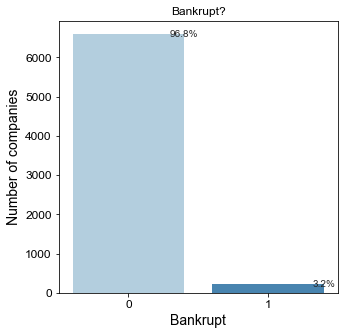

In [9]:
# We are checking for imbalanced data
# Print figure

import seaborn as sns

plt.figure(figsize=(5,5))
splot = sns.countplot(data = df,x = 'Bankrupt?',palette = 'Blues')
sns.set_style('ticks')
total = float(len(df))
for p in splot.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_height()
    splot.annotate(percentage, (x,y), ha = 'center', va = 'center')
plt.title("Bankrupt?")
plt.xlabel("Bankrupt")
plt.ylabel("Number of companies")

In [10]:
# We are going to work later on on this issue.

<AxesSubplot:>

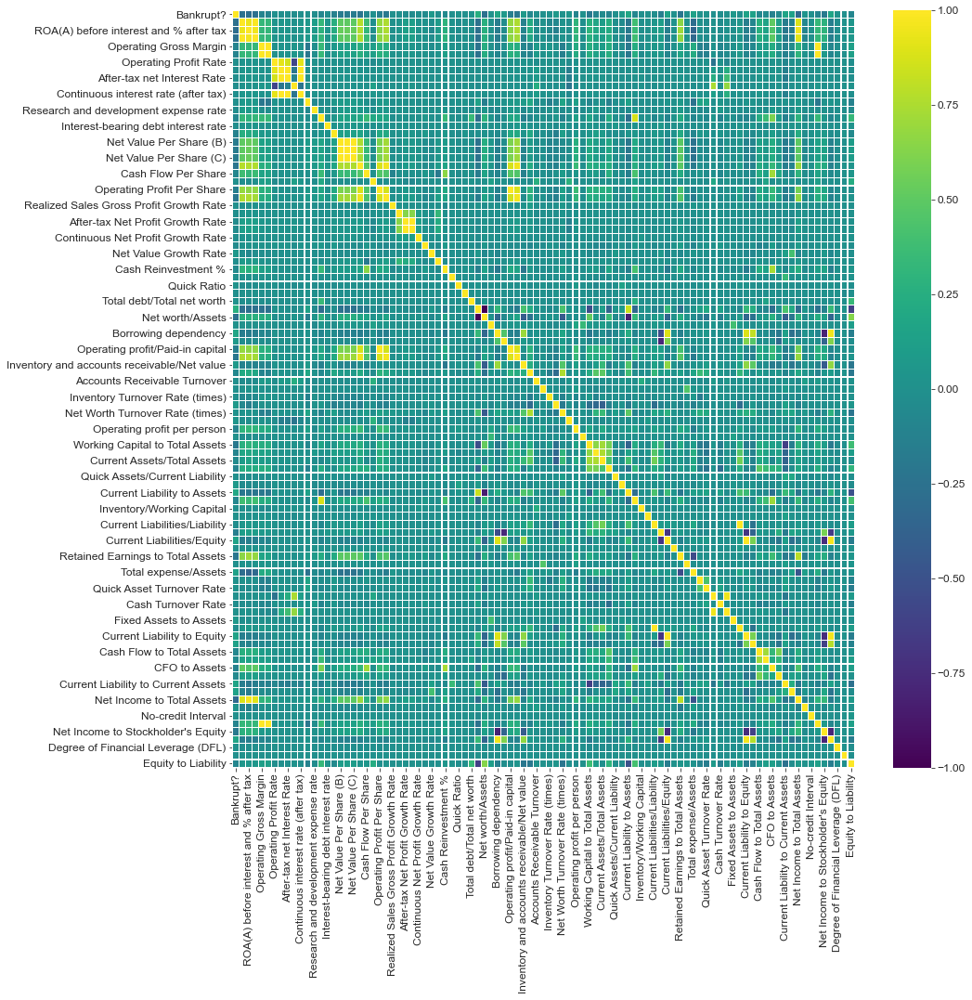

In [11]:
# Correlation

corr = df.corr()
fig, ax = plt.subplots(figsize = (15,15))
sns.heatmap(corr, ax = ax, cmap = 'viridis', linewidth = 0.1)

In [12]:
# Variable creation
X = df.drop(['Bankrupt?'], axis=1)
y = df['Bankrupt?']

In [13]:
X.head()

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
0,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,0.780985,1.256970e-04,0.0,0.458143,0.000725,0.0,0.147950,0.147950,0.147950,0.169141,0.311664,0.017560,0.095921,0.138736,0.022102,0.848195,0.688979,0.688979,0.217535,4.980000e+09,0.000327,0.263100,0.363725,0.002259,0.001208,0.629951,0.021266,0.207576,0.792424,0.005024,0.390284,0.006479,0.095885,0.137757,0.398036,0.086957,0.001814,0.003487,1.820930e-04,1.165010e-04,0.032903,0.034164,0.392913,0.037135,0.672775,0.166673,0.190643,0.004094,0.001997,1.473360e-04,0.147308,0.334015,0.276920,0.001036,0.676269,0.721275,0.339077,0.025592,0.903225,0.002022,0.064856,7.010000e+08,6.550000e+09,0.593831,4.580000e+08,0.671568,0.424206,0.676269,0.339077,0.126549,0.637555,0.458609,0.520382,0.312905,0.118250,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,0.781506,2.897850e-04,0.0,0.461867,0.000647,0.0,0.182251,0.182251,0.182251,0.208944,0.318137,0.021144,0.093722,0.169918,0.022080,0.848088,0.689693,0.689702,0.217620,6.110000e+09,0.000443,0.264516,0.376709,0.006016,0.004039,0.635172,0.012502,0.171176,0.828824,0.005059,0.376760,0.005835,0.093743,0.168962,0.397725,0.064468,0.001286,0.004917,9.360000e+09,7.190000e+08,0.025484,0.006889,0.391590,0.012335,0.751111,0.127236,0.182419,0.

In [14]:
display(X.shape)
display(y.shape)

(6819, 94)

(6819,)

## Preparing Data for ML models
*Splitting the data*

In [15]:
from sklearn.model_selection import train_test_split

X_train, X_test_final, y_train, y_test_final = train_test_split(X,y, test_size=0.2, random_state=42)

In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_train,y_train, test_size=0.25, random_state=42)

In [17]:
X_train.shape

(4091, 94)

In [18]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

num_pipeline = Pipeline([('std_scaler', StandardScaler())])

num_attribs = list(X_train)

full_pipeline = ColumnTransformer([("num", num_pipeline, num_attribs)])

In [19]:
X_train_prepared = full_pipeline.fit_transform(X_train)
X_test_prepared = full_pipeline.transform(X_test)
X_test_final_prepared = full_pipeline.transform(X_test_final)

In [20]:
X_train_prepared = pd.DataFrame(X_train_prepared, columns=num_attribs)
X_test_prepared = pd.DataFrame(X_test_prepared, columns=num_attribs)
X_test_final_prepared = pd.DataFrame(X_test_final_prepared, columns=num_attribs)

In [21]:
'''
#Scaling
from sklearn.preprocessing import StandardScaler
x_col = X.columns
scaler = StandardScaler()
x_scaled = scaler.fit_transform(X)
X = pd.DataFrame(x_scaled)
X.columns = x_col
#X.apply(pd.to_numeric)
display(X.head())
'''

'\n#Scaling\nfrom sklearn.preprocessing import StandardScaler\nx_col = X.columns\nscaler = StandardScaler()\nx_scaled = scaler.fit_transform(X)\nX = pd.DataFrame(x_scaled)\nX.columns = x_col\n#X.apply(pd.to_numeric)\ndisplay(X.head())\n'

In [22]:
display(X_train.shape)
display(y_train.shape)

(4091, 94)

(4091,)

In [23]:
count = 0
for i in y_train:
    if i == 1:
        count +=1
print("There are",count,"cases of bankruptcy and",len(y_train)-count,"of non-bankruptcy")

There are 128 cases of bankruptcy and 3963 of non-bankruptcy


In [24]:
y_train = pd.DataFrame(y_train)
y_test = pd.DataFrame(y_test)

In [25]:
y_train.reset_index(inplace=True)
y_train.drop(columns='index',axis=1,inplace=True)
y_test.reset_index(inplace=True)
y_test.drop(columns='index',inplace=True)
y_train.head()

,Bankrupt?
0,0
1,0
2,0
3,0
4,0


### Base Model

In [26]:
# Find some classification models and check their baseline accuracy with 10 CV folds

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate
from sklearn.metrics import f1_score
import xgboost as xgb
import lightgbm as lgb
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import plot_roc_curve



def get_model():
    models = []
    models.append(('LR' , LogisticRegression()))
    models.append(('KNN', KNeighborsClassifier()))
    models.append(('SVM', SVC()))
    models.append(('GBC', GradientBoostingClassifier()))
    models.append(('RF' , RandomForestClassifier(n_estimators=100)))
    models.append(('MLP', MLPClassifier()))
    models.append(('LDA', LinearDiscriminantAnalysis()))
    models.append(('ADABoost' , AdaBoostClassifier()))
    models.append(('XGB' , xgb.XGBClassifier()))
    models.append(('LightGBM' , lgb.LGBMClassifier()))
    return models

def bl_performance(X_train, y_train,models):
    plt.figure(figsize=(20,8))
    plt.title('ROC Curve', fontsize=14)
    results = []
    names = []
    acc = []
    f1 = []
    recall = []
    precision = []
    for name, model in models:
        kfold = KFold(n_splits=5)
        cv_results = cross_validate(model, X_train, y_train, cv=kfold, scoring=['accuracy','f1','recall','precision'])
        print(cv_results)
        results.append(cv_results)
        names.append(name)
        print('{}: CV accuracy mean: {:.4}'.format(name, cv_results['test_accuracy'].mean()))
        print('{}: CV F1 score mean: {:.4}'.format(name, cv_results['test_f1'].mean()))
        print('{}: CV Recall score mean: {:.4}'.format(name, cv_results['test_recall'].mean()))
        print('{}: CV Precision score mean: {:.4}'.format(name, cv_results['test_precision'].mean()))
        acc += [cv_results['test_accuracy'].mean()]
        f1 += [cv_results['test_f1'].mean()]
        recall += [cv_results['test_recall'].mean()]
        precision += [cv_results['test_precision'].mean()]
        
        model.fit(X_train_prepared,y_train)
        y_pred = model.predict(X_test_prepared)
        fpr, tpr, _ = roc_curve(y_test, y_pred)
        
        
        plt.plot(fpr, tpr, label='{} Classifier Score: {:.4f}'.format(name,roc_auc_score(y_test, y_pred)))
        
        
        
    result_df = pd.DataFrame()
    result_df['Model'] = ['LR','KNN','SVM','GBC','RF','MLP','LDA','ADABoost','XGB','LightGBM']
    result_df['Accuracy'] = acc
    result_df['F1'] = f1
    result_df['Recall'] = recall
    result_df['Precision'] = precision
    
    plt.plot([0, 1], [0, 1], 'k--')
    plt.axis([-0.01, 1, 0, 1])
    plt.xlabel('False Positive Rate', fontsize=13)
    plt.ylabel('True Positive Rate', fontsize=13)
    plt.annotate('Minimum ROC Score of 50% \n (This is the minimum score to get)', xy=(0.5, 0.5), xytext=(0.6, 0.3),
                arrowprops=dict(facecolor='#6E726D', shrink=0.05),
                )
    plt.legend()
        
    return names, results, result_df

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel

{'fit_time': array([0.18027258, 0.10762668, 0.07919168, 0.08428454, 0.06863904]), 'score_time': array([0.01316929, 0.00697446, 0.00749636, 0.0081656 , 0.00761652]), 'test_accuracy': array([0.96581197, 0.96210269, 0.9608802 , 0.97555012, 0.96577017]), 'test_f1': array([0.26315789, 0.34042553, 0.30434783, 0.375     , 0.17647059]), 'test_recall': array([0.22727273, 0.25806452, 0.25      , 0.28571429, 0.11538462]), 'test_precision': array([0.3125    , 0.5       , 0.38888889, 0.54545455, 0.375     ])}
LR: CV accuracy mean: 0.966
LR: CV F1 score mean: 0.2919
LR: CV Recall score mean: 0.2273
LR: CV Precision score mean: 0.4244


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples

{'fit_time': array([0.01002026, 0.02555442, 0.0120244 , 0.00921726, 0.0108068 ]), 'score_time': array([0.14825368, 0.13312387, 0.16437054, 0.15610099, 0.14040375]), 'test_accuracy': array([0.97313797, 0.96577017, 0.9608802 , 0.97555012, 0.97066015]), 'test_f1': array([0.26666667, 0.17647059, 0.05882353, 0.28571429, 0.25      ]), 'test_recall': array([0.18181818, 0.09677419, 0.03571429, 0.19047619, 0.15384615]), 'test_precision': array([0.5       , 1.        , 0.16666667, 0.57142857, 0.66666667])}
KNN: CV accuracy mean: 0.9692
KNN: CV F1 score mean: 0.2075
KNN: CV Recall score mean: 0.1317
KNN: CV Precision score mean: 0.581


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero

{'fit_time': array([0.25355983, 0.23341918, 0.31263781, 0.17605448, 0.21897173]), 'score_time': array([0.13073993, 0.11335492, 0.09446502, 0.17198324, 0.12106919]), 'test_accuracy': array([0.97313797, 0.96210269, 0.96454768, 0.97432763, 0.96821516]), 'test_f1': array([0., 0., 0., 0., 0.]), 'test_recall': array([0., 0., 0., 0., 0.]), 'test_precision': array([0., 0., 0., 0., 0.])}
SVM: CV accuracy mean: 0.9685
SVM: CV F1 score mean: 0.0
SVM: CV Recall score mean: 0.0
SVM: CV Precision score mean: 0.0


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel

{'fit_time': array([10.84834599, 10.92995954, 10.93134379, 12.07178307, 11.89484143]), 'score_time': array([0.02979803, 0.01295519, 0.01381493, 0.02220917, 0.01515722]), 'test_accuracy': array([0.97557998, 0.9608802 , 0.9596577 , 0.97066015, 0.96332518]), 'test_f1': array([0.41176471, 0.33333333, 0.29787234, 0.36842105, 0.31818182]), 'test_recall': array([0.31818182, 0.25806452, 0.25      , 0.33333333, 0.26923077]), 'test_precision': array([0.58333333, 0.47058824, 0.36842105, 0.41176471, 0.38888889])}
GBC: CV accuracy mean: 0.966
GBC: CV F1 score mean: 0.3459
GBC: CV Recall score mean: 0.2858
GBC: CV Precision score mean: 0.4446


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  estimator.fit(X_train, y_train, **fit_params)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning: A column-vector y was passed when a 1d array was expect

{'fit_time': array([2.26790047, 2.17943668, 2.01142192, 2.1539247 , 1.98126793]), 'score_time': array([0.04139781, 0.04520154, 0.02210259, 0.04610705, 0.02104735]), 'test_accuracy': array([0.97557998, 0.96454768, 0.96577017, 0.97188264, 0.96943765]), 'test_f1': array([0.375     , 0.21621622, 0.22222222, 0.20689655, 0.19354839]), 'test_recall': array([0.27272727, 0.12903226, 0.14285714, 0.14285714, 0.11538462]), 'test_precision': array([0.6       , 0.66666667, 0.5       , 0.375     , 0.6       ])}
RF: CV accuracy mean: 0.9694
RF: CV F1 score mean: 0.2428
RF: CV Recall score mean: 0.1606
RF: CV Precision score mean: 0.5483


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:60: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\

{'fit_time': array([6.15705538, 5.58798122, 5.97789502, 6.40896964, 5.63518858]), 'score_time': array([0.02419043, 0.00827336, 0.01107717, 0.01806545, 0.01296139]), 'test_accuracy': array([0.96703297, 0.96332518, 0.96332518, 0.96699267, 0.9608802 ]), 'test_f1': array([0.30769231, 0.44444444, 0.34782609, 0.34146341, 0.15789474]), 'test_recall': array([0.27272727, 0.38709677, 0.28571429, 0.33333333, 0.11538462]), 'test_precision': array([0.35294118, 0.52173913, 0.44444444, 0.35      , 0.25      ])}
MLP: CV accuracy mean: 0.9643
MLP: CV F1 score mean: 0.3199
MLP: CV Recall score mean: 0.2789
MLP: CV Precision score mean: 0.3838


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel

{'fit_time': array([0.1066916 , 0.0618782 , 0.0735836 , 0.07418966, 0.07500339]), 'score_time': array([0.00997639, 0.00807142, 0.00977707, 0.01186395, 0.00884986]), 'test_accuracy': array([0.96947497, 0.95232274, 0.95843521, 0.9596577 , 0.95476773]), 'test_f1': array([0.48979592, 0.38095238, 0.34615385, 0.19512195, 0.17777778]), 'test_recall': array([0.54545455, 0.38709677, 0.32142857, 0.19047619, 0.15384615]), 'test_precision': array([0.44444444, 0.375     , 0.375     , 0.2       , 0.21052632])}
LDA: CV accuracy mean: 0.9589
LDA: CV F1 score mean: 0.318
LDA: CV Recall score mean: 0.3197
LDA: CV Precision score mean: 0.321


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel

{'fit_time': array([2.47886658, 2.4658072 , 2.07458949, 2.30196977, 2.21170139]), 'score_time': array([0.04854989, 0.03530073, 0.05075908, 0.03688455, 0.02263069]), 'test_accuracy': array([0.96703297, 0.95843521, 0.95599022, 0.96943765, 0.96577017]), 'test_f1': array([0.4       , 0.22727273, 0.25      , 0.19354839, 0.26315789]), 'test_recall': array([0.40909091, 0.16129032, 0.21428571, 0.14285714, 0.19230769]), 'test_precision': array([0.39130435, 0.38461538, 0.3       , 0.3       , 0.41666667])}
ADABoost: CV accuracy mean: 0.9633
ADABoost: CV F1 score mean: 0.2668
ADABoost: CV Recall score mean: 0.224
ADABoost: CV Precision score mean: 0.3585


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[11:26:36] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[11:26:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[11:26:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[11:26:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


[11:26:40] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'fit_time': array([1.28369427, 1.14697051, 1.20568085, 0.99830914, 1.00729299]), 'score_time': array([0.0163219 , 0.01547551, 0.01509547, 0.01047802, 0.01171255]), 'test_accuracy': array([0.97313797, 0.97188264, 0.96821516, 0.97555012, 0.96454768]), 'test_f1': array([0.26666667, 0.46511628, 0.31578947, 0.33333333, 0.29268293]), 'test_recall': array([0.18181818, 0.32258065, 0.21428571, 0.23809524, 0.23076923]), 'test_precision': array([0.5       , 0.83333333, 0.6       , 0.55555556, 0.4       ])}
XGB: CV accuracy mean: 0.9707
XGB: CV F1 score mean: 0.3347
XGB: CV Recall score mean: 0.2375
XGB: CV Precision score mean: 0.5778
[11:26:41] WARNING: C:/Users/Administrator/workspace/xgbo

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\Users\Dell\anaconda3\lib\site

{'fit_time': array([0.58719468, 0.45800972, 0.52628064, 0.44420719, 0.51926327]), 'score_time': array([0.01062393, 0.01109982, 0.0110147 , 0.01094198, 0.01259613]), 'test_accuracy': array([0.97802198, 0.96943765, 0.96943765, 0.97188264, 0.96699267]), 'test_f1': array([0.4       , 0.41860465, 0.32432432, 0.20689655, 0.27027027]), 'test_recall': array([0.27272727, 0.29032258, 0.21428571, 0.14285714, 0.19230769]), 'test_precision': array([0.75      , 0.75      , 0.66666667, 0.375     , 0.45454545])}
LightGBM: CV accuracy mean: 0.9712
LightGBM: CV F1 score mean: 0.324
LightGBM: CV Recall score mean: 0.2225
LightGBM: CV Precision score mean: 0.5992


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)


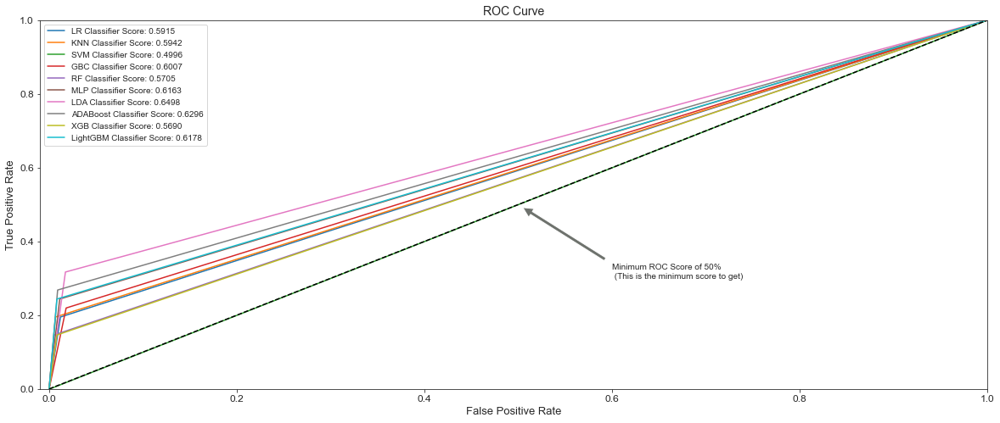

In [27]:
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

models = get_model()
names,results,result_df= bl_performance(X_train_prepared, y_train,models)

result_df.sort_values(by='F1',ascending=False,inplace=True)

In [28]:
result_df

,Model,Accuracy,F1,Recall,Precision
3,GBC,0.966021,0.345915,0.285762,0.444599
8,XGB,0.970667,0.334718,0.237510,0.577778
9,LightGBM,0.971155,0.324019,0.222500,0.599242
5,MLP,0.964311,0.319864,0.278851,0.383825
6,LDA,0.958932,0.317960,0.319660,0.320994
0,LR,0.966023,0.291880,0.227287,0.424369
7,ADABoost,0.963333,0.266796,0.223966,0.358517
4,RF,0.969444,0.242777,0.160572,0.548333
1,KNN,0.969200,0.207535,0.131726,0.580952
2,SVM,0.968466,0.000000,0.000000,0.000000


In [29]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(result_df, x="Model", y=['Accuracy','F1','Recall','Precision'], barmode='group',
             height=400)

fig.update_yaxes(title_text="Model Metrics")
fig.update_layout(
    title_text="Model Performance"
)
fig.show()

## Feature Selection, resampling and data transformation

In [30]:
#Anomaly Detection
from sklearn.ensemble import IsolationForest
iforest = IsolationForest(n_estimators=100,contamination=0.01)
pred = iforest.fit_predict(X_train_prepared)
score = iforest.decision_function(X_train_prepared)
from numpy import where
anom_index = where(pred==-1)
values = X.iloc[anom_index]

for i in values.index:
    X_train_prepared = X_train_prepared.drop(i)
    y_train = y_train.drop(i)

In [31]:
ctr = len(values)
print("Number of observations dropped = {}".format(ctr))

Number of observations dropped = 41


In [32]:
# Modelling with balanced target 

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

model = RandomForestClassifier(n_estimators=1000, n_jobs=-1)
model.fit(X_train_prepared, y_train)

sel = SelectFromModel(model)
sel.fit(X_test_prepared, y_test)

selected_feat= X_train.columns[(sel.get_support())]

C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:7: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_from_model.py:234: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



In [33]:
!pip install imblearn

In [34]:
# Dealing with imbalanced data
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline

over = SMOTE(sampling_strategy = 0.2)
under = RandomUnderSampler(sampling_strategy = 0.6)

steps = [('o',over),('u',under)]
pipeline = Pipeline(steps = steps)

#X_train_prepared, y_train = pipeline.fit_resample(X_train_prepared, y_train)
over_sample=SMOTE()
X_train_prepared, y_train=over_sample.fit_resample(X_train_prepared,y_train)

In [35]:
display(X_train_prepared.shape)
display(y_train.shape)

(7866, 94)

(7866, 1)

Text(0, 0.5, 'Number of companies')

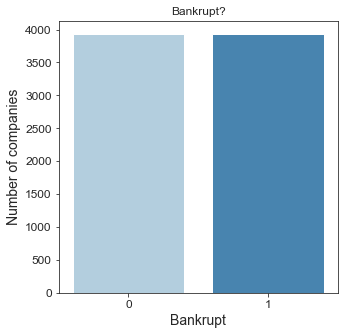

In [36]:
plt.figure(figsize=(5,5))
splot = sns.countplot(data = y_train, x = 'Bankrupt?', palette = 'Blues')
sns.set_style('ticks')
total = float(len(df))
plt.title("Bankrupt?")
plt.xlabel("Bankrupt")
plt.ylabel("Number of companies")

### Dropping highly correlated columns (greater than 0.85)

In [37]:
!pip install rfpimp

  Created wheel for rfpimp: filename=rfpimp-1.3.7-py3-none-any.whl size=10674 sha256=b257100ff91314815f14597619811e1a0a623ab21c3e73dc88679a502921d313
  Stored in directory: c:\users\dell\appdata\local\pip\cache\wheels\ad\48\d9\21fc62fbeff405425b0d5dd8b0354576cdb62ac97f6b11d1ef
Successfully built rfpimp


In [38]:
import rfpimp
from rfpimp import plot_corr_heatmap
limit = 0.85
corr = X_train_prepared.corr()

In [39]:
mask = np.triu(np.ones(corr.shape), k=1).astype(bool)
corr_no_diag = corr.where(mask)

In [40]:
corr_no_diag

,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share,Per Share Net profit before tax,Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Equity to Liability
ROA(C) before interest and depreciation before interest,NaN,0.951205,0.984858,0.398190,0.395775,0.024575,0.055967,0.050886,0.052672,0.054243,0.141911,-0.011183,0.382978,0.044456,0.413898,0.597080,0.594743,0.592726,0.852027,0.431966,0.006318,0.757834,0.840217,0.010025,0.035525,0.104397,0.105705,0.051595,0.148417,0.006726,0.097058,0.354763,0.016404,-0.058356,0.034558,-0.020905,-0.381937,0.381937,0.015809,-0.255528,-0.072090,0.757346,0.856204,-0.115647,0.234639,0.002722,-0.001807,0.002212,-0.058254,0.052185,0.029676,0.410027,0.003465,0.353734,0.181398,0.103480,0.243319,0.191939,-0.059790,-0.341904,0.421809,0.004011,0.049583,-0.028019,0.263143,-0.318787,-0.001674,0.758832,0.588877,-0.565951,0.044553,-0.054572,0.004147,0.060089,0.007451,0.009445,-0.028019,-0.318787,-0.042751,0.304787,0.172465,0.540196,0.300140,-0.225898,-0.151422,0.903886,-0.161636,0.046776,0.398191,0.811096,-0.268416,0.012111,0.048988,0.140252
ROA(A) before interest and % after tax,NaN,NaN,0.975648,0.383964,0.381711,0.021321,0.052701,0.048317,0.054109,0.050604,0.149313,-0.057156,0.345065,0.018075,0.380908,0.608506,0.606508,0.605491,0.823444,0.368347,0.008533,0.717369,0.814518,0.011854,0.029464,0.097519,0.099436,0.039959,0.163205,0.009708,0.094558,0.293028,0.016053,-0.044208,0.028717,-0.008058,-0.346536,0.346536,0.018668,-0.230758,-0.040342,0.716498,0.831033,-0.050454,0.226628,0.006344,0.00438

In [41]:
coll = [c for c in corr_no_diag.columns if any(abs(corr_no_diag[c]) > limit)]

In [42]:
## Highly corelated columns
coll

['ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',
 'Realized Sales Gross Margin',
 'Pre-tax net Interest Rate',
 'After-tax net Interest Rate',
 'Continuous interest rate (after tax)',
 'Net Value Per Share (A)',
 'Net Value Per Share (C)',
 'Persistent EPS in the Last Four Seasons',
 'Operating Profit Per Share',
 'Per Share Net profit before tax',
 'Regular Net Profit Growth Rate',
 'Net Value Growth Rate',
 'Net worth/Assets',
 'Operating profit/Paid-in capital',
 'Net profit before tax/Paid-in capital',
 'Operating Funds to Liability',
 'Working Capital/Equity',
 'Current Liabilities/Equity',
 'Cash Flow to Sales',
 'Current Liability to Liability',
 'Current Liability to Equity',
 'CFO to Assets',
 'Cash Flow to Equity',
 'Net Income to Total Assets',
 'Gross Profit to Sales',
 "Net Income to Stockholder's Equity",
 'Liability to Equity']

### Variance threshold

In [43]:
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=(.8 * (1 - .8)))

sel.fit(X_train_prepared)
var = sel.get_support()

col2 = []
for i in range(94):
    if not var[i]:
        col2.append(num_attribs[i])

In [44]:
col2

['Revenue Per Share (Yuan ¥)',
 'Net Value Growth Rate',
 'Contingent liabilities/Net worth',
 'Revenue per person',
 'Quick Assets/Current Liability',
 'Working Capital/Equity',
 "Net Income to Stockholder's Equity"]

In [45]:
## Highly corelated columns with variance > 0.16
col_del = coll.copy()
for i in coll:
    if i not in col2:
        col_del.append(i)
col_del

['ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',
 'Realized Sales Gross Margin',
 'Pre-tax net Interest Rate',
 'After-tax net Interest Rate',
 'Continuous interest rate (after tax)',
 'Net Value Per Share (A)',
 'Net Value Per Share (C)',
 'Persistent EPS in the Last Four Seasons',
 'Operating Profit Per Share',
 'Per Share Net profit before tax',
 'Regular Net Profit Growth Rate',
 'Net Value Growth Rate',
 'Net worth/Assets',
 'Operating profit/Paid-in capital',
 'Net profit before tax/Paid-in capital',
 'Operating Funds to Liability',
 'Working Capital/Equity',
 'Current Liabilities/Equity',
 'Cash Flow to Sales',
 'Current Liability to Liability',
 'Current Liability to Equity',
 'CFO to Assets',
 'Cash Flow to Equity',
 'Net Income to Total Assets',
 'Gross Profit to Sales',
 "Net Income to Stockholder's Equity",
 'Liability to Equity',
 'ROA(A) before interest and % after tax',
 'ROA(B) before interest and depreciation after tax',


In [46]:
## 31 columns removed
X_train_prepared_old = X_train_prepared.copy()
X_train_prepared.drop(columns=col_del,axis=1,inplace=True)

In [47]:
X_train_prepared.shape

(7866, 66)

In [48]:
'''
def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

    return(dataset)

filtered_col = correlation(df, 0.65).columns
df = df[filtered_col]
df
correlation(df, 0.65)
'''

'\ndef correlation(dataset, threshold):\n    col_corr = set() # Set of all the names of deleted columns\n    corr_matrix = dataset.corr()\n    for i in range(len(corr_matrix.columns)):\n        for j in range(i):\n            if (abs(corr_matrix.iloc[i, j]) >= threshold) and (corr_matrix.columns[j] not in col_corr):\n                colname = corr_matrix.columns[i] # getting the name of column\n                col_corr.add(colname)\n                if colname in dataset.columns:\n                    del dataset[colname] # deleting the column from the dataset\n\n    return(dataset)\n\nfiltered_col = correlation(df, 0.65).columns\ndf = df[filtered_col]\ndf\ncorrelation(df, 0.65)\n'

### Tree-Based Feature Selection

C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:9: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



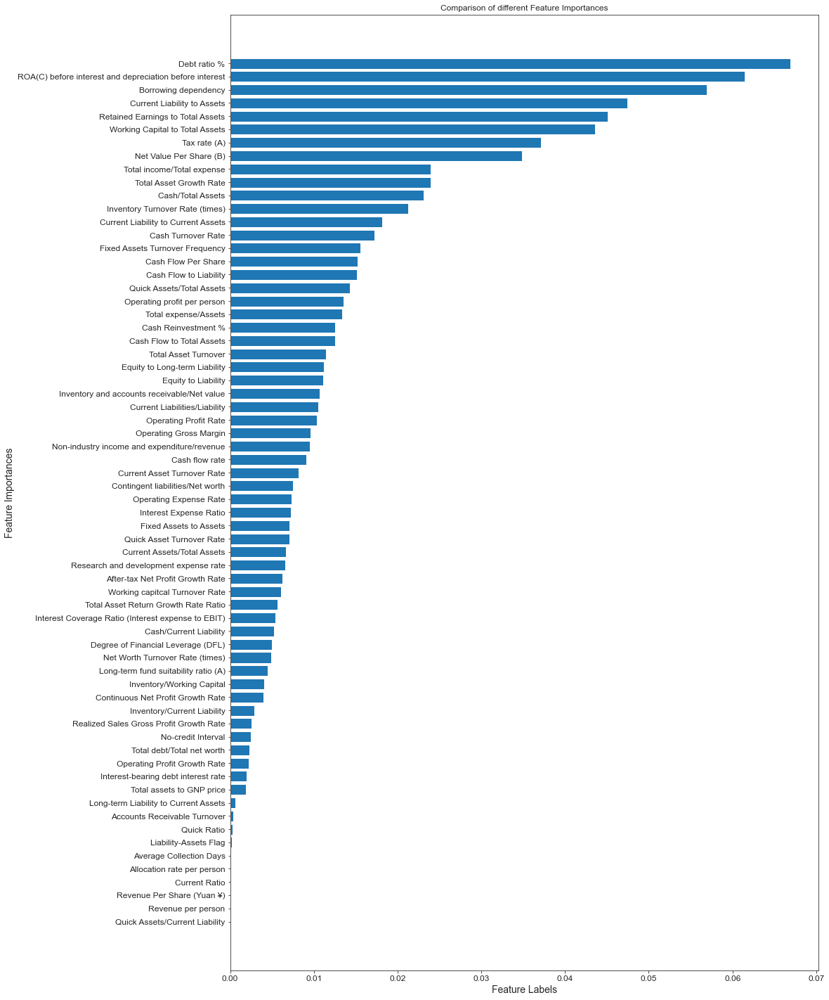

In [49]:
# feature selection (tree-based)

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.datasets import load_iris
from sklearn.feature_selection import SelectFromModel
import matplotlib.pyplot as plt

clf = ExtraTreesClassifier(n_estimators=50, random_state=45)
clf = clf.fit(X_train_prepared, y_train)
feature_importance = clf.feature_importances_
  
# Normalizing the individual importances 
feature_importance_normalized = np.std([tree.feature_importances_ for tree in 
                                        clf.estimators_], 
                                        axis = 0) 

tbfs = pd.DataFrame(
    {"X": X_train_prepared.columns, "FI": feature_importance_normalized}
)

tbfs = tbfs.sort_values('FI',ascending=True)


# Plotting a Bar Graph to compare the models 
plt.figure(figsize=(15,25))
plt.barh(y=tbfs['X'],width=tbfs['FI']) 
plt.xlabel('Feature Labels') 
plt.ylabel('Feature Importances') 
plt.title('Comparison of different Feature Importances') 
plt.show()


### Recursive Feature Elimination

In [50]:
!pip install yellowbrick

In [51]:
from sklearn.feature_selection import RFE
from sklearn import ensemble
from yellowbrick.features import RFECV

## RFE

rf = RandomForestClassifier(random_state=42)
model = RFE(rf, n_features_to_select=50)
fit_model = model.fit(X_train_prepared, y_train)
features = pd.DataFrame(list(zip(X_train_prepared.columns,fit_model.ranking_)), columns = ['predictor','ranking'])

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\feature_selection\_rfe.py:241: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklear

In [52]:
features = features.sort_values(by = 'ranking')

In [53]:
## RFE and Tree based feature importance signify that features with rank greater than 3 in RFE are insignificant
chosen_features = features[features['ranking']<3]

In [54]:
chosen_features.shape

(51, 2)

### Sequential Feature Selection

In [55]:
'''
import datetime
from datetime import *
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import Lasso

rf = RandomForestClassifier()

## Forward SFE

now = datetime.now()
sfs_forward = SequentialFeatureSelector(rf,n_features_to_select=10,direction='forward').fit(X_train_prepared, y_train)
print("Forward Sequential Feature Selection done in {}".format(datetime.now()-now))

## Backward SFE
now = datetime.now()
sfs_backward = SequentialFeatureSelector(rf,direction='backward').fit(X_train_prepared, y_train)
print("Backward Sequential Feature Selection done in {}".format(datetime.now()-now))

bool = sfs_forward.get_support()

chosen_features.reset_index(inplace=True)
chosen_features.drop(columns='index',axis=1,inplace=True)
chosen_features.shape

## chosen features from forward sequential feature selection
fwd_features = []
for i in range(51):
    if bool[i]:
        fwd_features.append(chosen_features['predictor'][i])
fwd_features
sfs_backward.get_support()


X_train_prepared_small = X_train_prepared[fwd_features]
X_test_prepared_small = X_test_prepared[fwd_features]
'''

'\nimport datetime\nfrom datetime import *\nfrom sklearn.feature_selection import SequentialFeatureSelector\nfrom sklearn.linear_model import Lasso\n\nrf = RandomForestClassifier()\n\n## Forward SFE\n\nnow = datetime.now()\nsfs_forward = SequentialFeatureSelector(rf,n_features_to_select=10,direction=\'forward\').fit(X_train_prepared, y_train)\nprint("Forward Sequential Feature Selection done in {}".format(datetime.now()-now))\n\n## Backward SFE\nnow = datetime.now()\nsfs_backward = SequentialFeatureSelector(rf,direction=\'backward\').fit(X_train_prepared, y_train)\nprint("Backward Sequential Feature Selection done in {}".format(datetime.now()-now))\n\nbool = sfs_forward.get_support()\n\nchosen_features.reset_index(inplace=True)\nchosen_features.drop(columns=\'index\',axis=1,inplace=True)\nchosen_features.shape\n\n## chosen features from forward sequential feature selection\nfwd_features = []\nfor i in range(51):\n    if bool[i]:\n        fwd_features.append(chosen_features[\'predictor\

#### Selected Features

In [56]:
chosen_features

,predictor,ranking
0,ROA(C) before interest and depreciation before...,1
64,Interest Coverage Ratio (Interest expense to E...,1
33,Net Worth Turnover Rate (times),1
35,Operating profit per person,1
37,Working Capital to Total Assets,1
38,Quick Assets/Total Assets,1
39,Current Assets/Total Assets,1
40,Cash/Total Assets,1
43,Current Liability to Assets,1
44,Inventory/Working Capital,1


In [57]:
## Training and test set with selected features
X_train_prepared = X_train_prepared[chosen_features['predictor']]
X_test_prepared = X_test_prepared[chosen_features['predictor']]
X_test_final_prepared = X_test_final_prepared[chosen_features['predictor']]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.11407256, 0.07666612, 0.08610654, 0.08017159, 0.09396052]), 'score_time': array([0.00709653, 0.0075686 , 0.00698948, 0.00809383, 0.0069766 ]), 'test_accuracy': array([0.85768742, 0.85505404, 0.8862047 , 0.87666879, 0.86713287]), 'test_f1': array([0.27741935, 0.24      , 0.87731323, 0.93428184, 0.92883895]), 'test_recall': array([0.91489362, 0.9       , 0.91428571, 0.87666879, 0.86713287]), 'test_precision': array([0.1634981 , 0.13846154, 0.84321476, 1.        , 1.        ])}
LR: CV accuracy mean: 0.8685
LR: CV F1 score mean: 0.6516
LR: CV Recall score mean: 0.8946
LR: CV Precision score mean: 0.629


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\skl

{'fit_time': array([0.0073638 , 0.00498509, 0.01066136, 0.0059793 , 0.00649476]), 'score_time': array([0.3042984 , 0.32534862, 0.27457643, 0.27981687, 0.34702826]), 'test_accuracy': array([0.85578145, 0.86840432, 0.92689129, 1.        , 1.        ]), 'test_f1': array([0.29283489, 0.27874564, 0.92409241, 1.        , 1.        ]), 'test_recall': array([1., 1., 1., 1., 1.]), 'test_precision': array([0.17153285, 0.16194332, 0.85889571, 1.        , 1.        ])}
KNN: CV accuracy mean: 0.9302
KNN: CV F1 score mean: 0.6991
KNN: CV Recall score mean: 1.0
KNN: CV Precision score mean: 0.6385


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validat

{'fit_time': array([0.8221457 , 0.856004  , 0.89233899, 1.07833552, 0.85562825]), 'score_time': array([0.32858372, 0.33609819, 0.37131596, 0.40200758, 0.43680096]), 'test_accuracy': array([0.92121982, 0.93197711, 0.95867769, 0.99364272, 0.98347107]), 'test_f1': array([0.43119266, 0.42780749, 0.95526497, 0.99681122, 0.99166667]), 'test_recall': array([1.        , 1.        , 0.99142857, 0.99364272, 0.98347107]), 'test_precision': array([0.2748538 , 0.27210884, 0.92164675, 1.        , 1.        ])}
SVM: CV accuracy mean: 0.9578
SVM: CV F1 score mean: 0.7605
SVM: CV Recall score mean: 0.9937
SVM: CV Precision score mean: 0.6937


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([13.44153595, 13.27581477, 13.32114863, 13.16361809, 13.0098207 ]), 'score_time': array([0.01654005, 0.00844359, 0.0094254 , 0.00795341, 0.00962305]), 'test_accuracy': array([0.93202033, 0.93769866, 0.95486332, 0.9841068 , 0.97075652]), 'test_f1': array([0.44559585, 0.43023256, 0.95072866, 0.99198975, 0.98516129]), 'test_recall': array([0.91489362, 0.925     , 0.97857143, 0.9841068 , 0.97075652]), 'test_precision': array([0.29452055, 0.28030303, 0.92442645, 1.        , 1.        ])}
GBC: CV accuracy mean: 0.9559
GBC: CV F1 score mean: 0.7607
GBC: CV Recall score mean: 0.9547
GBC: CV Precision score mean: 0.6999


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packag

{'fit_time': array([5.41731238, 6.12199807, 5.39289999, 3.96091676, 3.98073769]), 'score_time': array([0.04567909, 0.04820418, 0.04578424, 0.06459069, 0.05548453]), 'test_accuracy': array([0.96378653, 0.96376351, 0.97902098, 0.99427845, 0.99491418]), 'test_f1': array([0.62251656, 0.58394161, 0.97684211, 0.99713102, 0.99745061]), 'test_recall': array([1.        , 1.        , 0.99428571, 0.99427845, 0.99491418]), 'test_precision': array([0.45192308, 0.41237113, 0.96      , 1.        , 1.        ])}
RF: CV accuracy mean: 0.9792
RF: CV F1 score mean: 0.8356
RF: CV Recall score mean: 0.9967
RF: CV Precision score mean: 0.7649


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:60: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataC

{'fit_time': array([7.10620213, 6.74596286, 6.01801181, 6.28126597, 6.20779753]), 'score_time': array([0.0095396 , 0.0109973 , 0.00804567, 0.0139389 , 0.01869535]), 'test_accuracy': array([0.9707751 , 0.97457088, 0.98537826, 1.        , 1.        ]), 'test_f1': array([0.67142857, 0.66666667, 0.98383696, 1.        , 1.        ]), 'test_recall': array([1., 1., 1., 1., 1.]), 'test_precision': array([0.50537634, 0.5       , 0.96818811, 1.        , 1.        ])}
MLP: CV accuracy mean: 0.9861
MLP: CV F1 score mean: 0.8644
MLP: CV Recall score mean: 1.0
MLP: CV Precision score mean: 0.7947


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.07592845, 0.05303764, 0.06528997, 0.06169748, 0.06190515]), 'score_time': array([0.01003599, 0.00697589, 0.0069766 , 0.00723004, 0.0059793 ]), 'test_accuracy': array([0.83163914, 0.83852511, 0.87158296, 0.85632549, 0.8518754 ]), 'test_f1': array([0.24501425, 0.21604938, 0.86126374, 0.92260274, 0.92001373]), 'test_recall': array([0.91489362, 0.875     , 0.89571429, 0.85632549, 0.8518754 ]), 'test_precision': array([0.14144737, 0.12323944, 0.82936508, 1.        , 1.        ])}
LDA: CV accuracy mean: 0.85
LDA: CV F1 score mean: 0.633
LDA: CV Recall score mean: 0.8788
LDA: CV Precision score mean: 0.6188


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([2.73925257, 3.17614126, 2.90208197, 2.98060989, 2.64151692]), 'score_time': array([0.02220011, 0.06155276, 0.03108072, 0.052459  , 0.0275836 ]), 'test_accuracy': array([0.91486658, 0.91417673, 0.93897012, 0.94151303, 0.93515575]), 'test_f1': array([0.37383178, 0.30769231, 0.93258427, 0.96987557, 0.96649146]), 'test_recall': array([0.85106383, 0.75      , 0.94857143, 0.94151303, 0.93515575]), 'test_precision': array([0.23952096, 0.19354839, 0.91712707, 1.        , 1.        ])}
ADABoost: CV accuracy mean: 0.9289
ADABoost: CV F1 score mean: 0.7101
ADABoost: CV Recall score mean: 0.8853
ADABoost: CV Precision score mean: 0.67


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:33:12] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:33:14] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:33:16] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:33:18] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:33:20] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'fit_time': array([1.46307135, 1.85550618, 1.90213752, 1.8540659 , 1.68330765]), 'score_time': array([0.01196003, 0.01579022, 0.01730585, 0.01431155, 0.01054478]), 'test_accuracy': array([0.9707751 , 0.97457088, 0.98792117, 0.99809282, 1.        ]), 'test_f1': array([0.66176471, 0.64285714, 0.98659139, 0.9990455 , 1.        ]), 'test_recall': array([0.95744681, 0.9       , 0.99857143, 0.99809282, 1.        ]), 'test_precision': array([0.50561798, 0.5       , 0.9748954 , 1.        , 1.        ])}
XGB: CV accuracy mean: 0.9863
XGB: CV F1 score mean: 0.8581
XGB: CV Recall score mean: 0.9708
XGB: CV Precision score mean: 0.7961
[11:33:21] WARNING: C:/Users/Administrator/workspace/xgbo

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array

{'fit_time': array([0.51475048, 0.38121939, 0.76140594, 0.48212242, 0.48531365]), 'score_time': array([0.01470733, 0.01228333, 0.02759933, 0.02632737, 0.02635908]), 'test_accuracy': array([0.97331639, 0.97139224, 0.98537826, 0.99872854, 0.99809282]), 'test_f1': array([0.68181818, 0.62809917, 0.98381422, 0.99936387, 0.9990455 ]), 'test_recall': array([0.95744681, 0.95      , 0.99857143, 0.99872854, 0.99809282]), 'test_precision': array([0.52941176, 0.4691358 , 0.96948682, 1.        , 1.        ])}
LightGBM: CV accuracy mean: 0.9854
LightGBM: CV F1 score mean: 0.8584
LightGBM: CV Recall score mean: 0.9806
LightGBM: CV Precision score mean: 0.7936


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



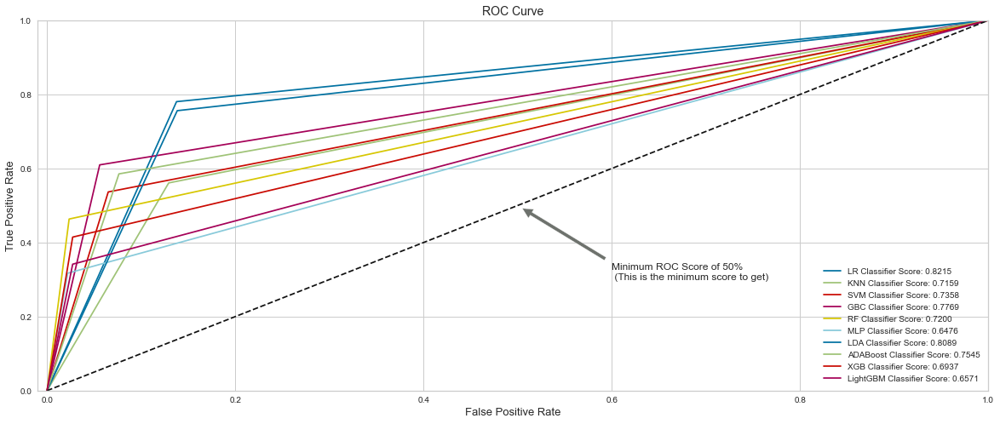

In [58]:
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

models = get_model()
names,results,result_df= bl_performance(X_train_prepared, y_train,models)

result_df.sort_values(by='F1',ascending=False,inplace=True)

In [59]:
result_df

,Model,Accuracy,F1,Recall,Precision
5,MLP,0.986145,0.864386,1.000000,0.794713
9,LightGBM,0.985382,0.858428,0.980568,0.793607
8,XGB,0.986272,0.858052,0.970822,0.796103
4,RF,0.979153,0.835576,0.996696,0.764859
3,GBC,0.955889,0.760742,0.954666,0.699850
2,SVM,0.957798,0.760549,0.993708,0.693722
7,ADABoost,0.928936,0.710095,0.885261,0.670039
1,KNN,0.930215,0.699135,1.000000,0.638474
0,LR,0.868550,0.651571,0.894596,0.629035
6,LDA,0.849990,0.632989,0.878762,0.618810


In [60]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(result_df, x="Model", y=['Accuracy','F1','Recall','Precision'], barmode='group',
             height=400)

fig.update_yaxes(title_text="Model Metrics")
fig.update_layout(
    title_text="Model Performance"
)
fig.show()

## Dimensionality Reduction
### PCA

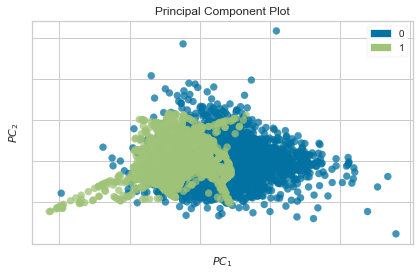

<AxesSubplot:title={'center':'Principal Component Plot'}, xlabel='$PC_1$', ylabel='$PC_2$'>

In [61]:
from yellowbrick.features.pca import (
 PCADecomposition,
)
fig, ax = plt.subplots(figsize=(6, 4))
colors = ["rg"[j] for j in y_train['Bankrupt?']]
pca_viz = PCADecomposition(color=colors)
pca_viz.fit_transform(X_train_prepared, y_train['Bankrupt?'])
pca_viz.poof()

In [62]:
# Dimension Reduction using PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=15)
X_train_prepared_PCA = pca.fit_transform(X_train_prepared)

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.04209948, 0.06063104, 0.04216838, 0.03919721, 0.03557467]), 'score_time': array([0.01289248, 0.00645971, 0.0154171 , 0.01009703, 0.01563692]), 'test_accuracy': array([0.80177891, 0.82390337, 0.8518754 , 0.82835346, 0.80928163]), 'test_f1': array([0.21212121, 0.20630372, 0.84095563, 0.90611961, 0.8945889 ]), 'test_recall': array([0.89361702, 0.9       , 0.88      , 0.82835346, 0.80928163]), 'test_precision': array([0.12034384, 0.11650485, 0.80522876, 1.        , 1.        ])}
LR: CV accuracy mean: 0.823
LR: CV F1 score mean: 0.612
LR: CV Recall score mean: 0.8623
LR: CV Precision score mean: 0.6084


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-pac

{'fit_time': array([0.07105613, 0.07914758, 0.05696607, 0.07467842, 0.05968928]), 'score_time': array([0.92782474, 0.75698519, 0.58960605, 0.39166164, 0.38091326]), 'test_accuracy': array([0.85324015, 0.8677686 , 0.92879847, 0.99682136, 0.9955499 ]), 'test_f1': array([0.28923077, 0.27777778, 0.92582781, 0.99840815, 0.99776999]), 'test_recall': array([1.        , 1.        , 0.99857143, 0.99682136, 0.9955499 ]), 'test_precision': array([0.16906475, 0.16129032, 0.86296296, 1.        , 1.        ])}
KNN: CV accuracy mean: 0.9284
KNN: CV F1 score mean: 0.6978
KNN: CV Recall score mean: 0.9982
KNN: CV Precision score mean: 0.6387


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validat

{'fit_time': array([1.87763834, 1.5676229 , 1.56352139, 1.71010756, 1.48214126]), 'score_time': array([0.68303585, 0.64535069, 0.81550026, 0.69524908, 0.7309134 ]), 'test_accuracy': array([0.88373571, 0.89701208, 0.92689129, 0.96567069, 0.95549905]), 'test_f1': array([0.33454545, 0.31932773, 0.92224476, 0.98253558, 0.97724317]), 'test_recall': array([0.9787234 , 0.95      , 0.97428571, 0.96567069, 0.95549905]), 'test_precision': array([0.20175439, 0.19191919, 0.87548139, 1.        , 1.        ])}
SVM: CV accuracy mean: 0.9258
SVM: CV F1 score mean: 0.7072
SVM: CV Recall score mean: 0.9648
SVM: CV Precision score mean: 0.6538


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([ 8.80098867,  8.50477052,  9.52338338, 12.00166202,  7.76272583]), 'score_time': array([0.01838279, 0.02100134, 0.03247046, 0.01539278, 0.02997565]), 'test_accuracy': array([0.87992376, 0.88048315, 0.91926256, 0.93897012, 0.92434838]), 'test_f1': array([0.32740214, 0.27692308, 0.91295408, 0.96852459, 0.96068715]), 'test_recall': array([0.9787234 , 0.9       , 0.95142857, 0.93897012, 0.92434838]), 'test_precision': array([0.1965812 , 0.16363636, 0.87747036, 1.        , 1.        ])}
GBC: CV accuracy mean: 0.9086
GBC: CV F1 score mean: 0.6893
GBC: CV Recall score mean: 0.9387
GBC: CV Precision score mean: 0.6475


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packag

{'fit_time': array([5.52427268, 6.59752464, 7.85117102, 6.71679592, 6.87914515]), 'score_time': array([0.10161948, 0.25826716, 0.17565441, 0.22590327, 0.22742033]), 'test_accuracy': array([0.94853875, 0.95486332, 0.97075652, 0.98283535, 0.98219962]), 'test_f1': array([0.53179191, 0.52980132, 0.96801113, 0.99134338, 0.99101988]), 'test_recall': array([0.9787234 , 1.        , 0.99428571, 0.98283535, 0.98219962]), 'test_precision': array([0.36507937, 0.36036036, 0.94308943, 1.        , 1.        ])}
RF: CV accuracy mean: 0.9678
RF: CV F1 score mean: 0.8024
RF: CV Recall score mean: 0.9876
RF: CV Precision score mean: 0.7337


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:60: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataC

{'fit_time': array([16.373806  , 17.61589766, 11.50052285, 11.36263537, 10.73468566]), 'score_time': array([0.01449609, 0.02031684, 0.01360035, 0.02009201, 0.01197362]), 'test_accuracy': array([0.95362135, 0.9612206 , 0.9771138 , 0.9955499 , 0.99809282]), 'test_f1': array([0.56287425, 0.56737589, 0.9748954 , 0.99776999, 0.9990455 ]), 'test_recall': array([1.        , 1.        , 0.99857143, 0.9955499 , 0.99809282]), 'test_precision': array([0.39166667, 0.3960396 , 0.95231608, 1.        , 1.        ])}
MLP: CV accuracy mean: 0.9771
MLP: CV F1 score mean: 0.8204
MLP: CV Recall score mean: 0.9984
MLP: CV Precision score mean: 0.748


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.02031612, 0.0202086 , 0.02939892, 0.030092  , 0.02704453]), 'score_time': array([0.00697541, 0.01046801, 0.01076245, 0.00933671, 0.0080657 ]), 'test_accuracy': array([0.78653113, 0.79338843, 0.8474253 , 0.83534647, 0.82136046]), 'test_f1': array([0.20379147, 0.18546366, 0.83805668, 0.9102875 , 0.90191972]), 'test_recall': array([0.91489362, 0.925     , 0.88714286, 0.83534647, 0.82136046]), 'test_precision': array([0.11466667, 0.10306407, 0.79411765, 1.        , 1.        ])}
LDA: CV accuracy mean: 0.8168
LDA: CV F1 score mean: 0.6079
LDA: CV Recall score mean: 0.8767
LDA: CV Precision score mean: 0.6024


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([1.09354639, 1.29079318, 1.16290522, 1.15995884, 1.39725995]), 'score_time': array([0.03938413, 0.03265357, 0.03614259, 0.02295971, 0.06602168]), 'test_accuracy': array([0.84434562, 0.8518754 , 0.87412587, 0.8474253 , 0.83280356]), 'test_f1': array([0.25981873, 0.22073579, 0.86269071, 0.91741225, 0.90877558]), 'test_recall': array([0.91489362, 0.825     , 0.88857143, 0.8474253 , 0.83280356]), 'test_precision': array([0.15140845, 0.12741313, 0.83827493, 1.        , 1.        ])}
ADABoost: CV accuracy mean: 0.8501
ADABoost: CV F1 score mean: 0.6339
ADABoost: CV Recall score mean: 0.8617
ADABoost: CV Precision score mean: 0.6234


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:37:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:37:23] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:37:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:37:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:37:33] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'fit_time': array([2.13264418, 2.74173903, 2.37420487, 4.27022243, 2.63534403]), 'score_time': array([0.02051592, 0.02572513, 0.03505826, 0.03122067, 0.01362348]), 'test_accuracy': array([0.94091487, 0.94596313, 0.96884933, 0.99364272, 0.99046408]), 'test_f1': array([0.4972973 , 0.47852761, 0.96608997, 0.99681122, 0.9952092 ]), 'test_recall': array([0.9787234 , 0.975     , 0.99714286, 0.99364272, 0.99046408]), 'test_precision': array([0.33333333, 0.31707317, 0.93691275, 1.        , 1.        ])}
XGB: CV accuracy mean: 0.968
XGB: CV F1 score mean: 0.7868
XGB: CV Recall score mean: 0.987
XGB: CV Precision score mean: 0.7175
[11:37:35] WARNING: C:/Users/Administrator/workspace/xgboos

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array

{'fit_time': array([0.75029111, 0.78185749, 0.4436245 , 0.4051013 , 0.37455893]), 'score_time': array([0.02996874, 0.02333212, 0.02230978, 0.02095699, 0.02584171]), 'test_accuracy': array([0.93456163, 0.94405594, 0.96884933, 0.99237127, 0.98537826]), 'test_f1': array([0.47715736, 0.46987952, 0.96599584, 0.99617103, 0.99263529]), 'test_recall': array([1.        , 0.975     , 0.99428571, 0.99237127, 0.98537826]), 'test_precision': array([0.31333333, 0.30952381, 0.93927126, 1.        , 1.        ])}
LightGBM: CV accuracy mean: 0.965
LightGBM: CV F1 score mean: 0.7804
LightGBM: CV Recall score mean: 0.9894
LightGBM: CV Precision score mean: 0.7124


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



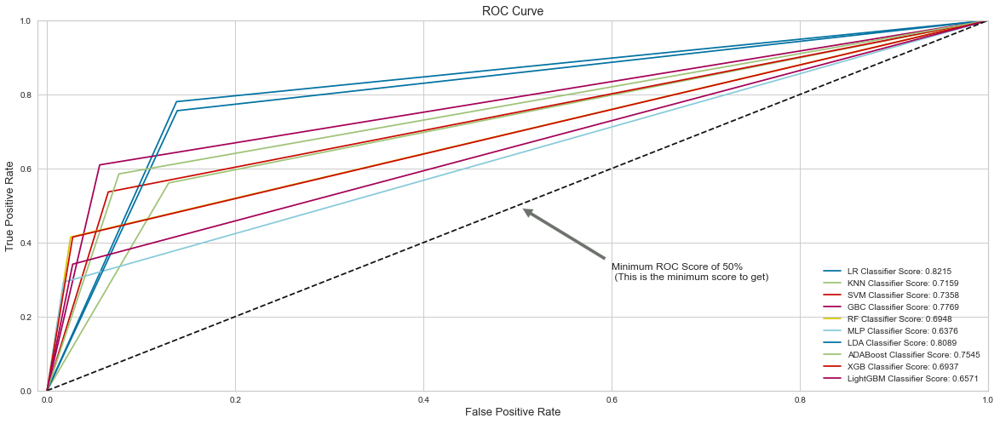

In [63]:
models = get_model()
names,results,result_df= bl_performance(X_train_prepared_PCA, y_train,models)

result_df.sort_values(by='F1',ascending=False,inplace=True)

import plotly.express as px
df = px.data.tips()
fig = px.bar(result_df, x="Model", y=['Accuracy','F1','Recall','Precision'], barmode='group',
             height=400)

fig.update_yaxes(title_text="Model Metrics")
fig.update_layout(
    title_text="Model Performance"
)
fig.show()

In [64]:
result_df

,Model,Accuracy,F1,Recall,Precision
5,MLP,0.977120,0.820392,0.998443,0.748004
4,RF,0.967839,0.802394,0.987609,0.733706
8,XGB,0.967967,0.786787,0.986995,0.717464
9,LightGBM,0.965043,0.780368,0.989407,0.712426
2,SVM,0.925762,0.707179,0.964836,0.653831
1,KNN,0.928436,0.697803,0.998189,0.638664
3,GBC,0.908598,0.689298,0.938694,0.647538
7,ADABoost,0.850115,0.633887,0.861739,0.623419
0,LR,0.823039,0.612018,0.862250,0.608415
6,LDA,0.816810,0.607904,0.876749,0.602370


In [65]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(result_df, x="Model", y=['Accuracy','F1','Recall','Precision'], barmode='group',
             height=400)

fig.update_yaxes(title_text="Model Metrics")
fig.update_layout(
    title_text="Model Performance"
)
fig.show()

### t-SNE

Text(0, 0.5, 'Embedding 2')

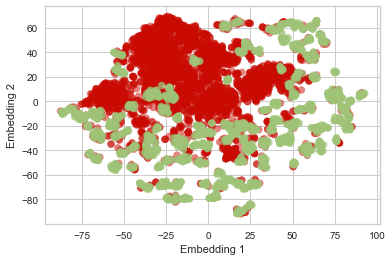

In [66]:
from sklearn.manifold import TSNE
ts = TSNE()
X_tsne = ts.fit_transform(X_train_prepared)
fig, ax = plt.subplots(figsize=(6, 4))
colors = ["rg"[j] for j in y_train['Bankrupt?']]
scat = ax.scatter(
 X_tsne[:, 0],
 X_tsne[:, 1],
 c=colors,
 alpha=0.5,
)
ax.set_xlabel("Embedding 1")
ax.set_ylabel("Embedding 2")

In [67]:
ts = TSNE(n_components=3)
X_tsne = ts.fit_transform(X_train_prepared)

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.03371739, 0.03739929, 0.03831649, 0.03928828, 0.03141856]), 'score_time': array([0.0217135 , 0.01392746, 0.01409674, 0.01532698, 0.01425076]), 'test_accuracy': array([0.72045743, 0.7221869 , 0.80991736, 0.70947235, 0.70565798]), 'test_f1': array([0.16030534, 0.13465347, 0.78809355, 0.83004835, 0.82743198]), 'test_recall': array([0.89361702, 0.85      , 0.79428571, 0.70947235, 0.70565798]), 'test_precision': array([0.08805031, 0.07311828, 0.78199719, 1.        , 1.        ])}
LR: CV accuracy mean: 0.7335
LR: CV F1 score mean: 0.5481
LR: CV Recall score mean: 0.7906
LR: CV Precision score mean: 0.5886


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-pac

{'fit_time': array([0.02355957, 0.03233337, 0.02522755, 0.03355861, 0.0260334 ]), 'score_time': array([0.17868423, 0.22566342, 0.20175505, 0.22528386, 0.2271235 ]), 'test_accuracy': array([0.88182973, 0.89256198, 0.94214876, 0.98474253, 0.9885569 ]), 'test_f1': array([0.33571429, 0.32128514, 0.93872054, 0.99231262, 0.99424552]), 'test_recall': array([1.        , 1.        , 0.99571429, 0.98474253, 0.9885569 ]), 'test_precision': array([0.20171674, 0.19138756, 0.88789809, 1.        , 1.        ])}
KNN: CV accuracy mean: 0.938
KNN: CV F1 score mean: 0.7165
KNN: CV Recall score mean: 0.9938
KNN: CV Precision score mean: 0.6562


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validat

{'fit_time': array([2.90197444, 1.6794405 , 1.42531419, 1.42032695, 1.25687432]), 'score_time': array([1.10764575, 0.60314751, 0.57172632, 0.62347674, 0.48616433]), 'test_accuracy': array([0.78780178, 0.80228862, 0.86458996, 0.85950413, 0.84678957]), 'test_f1': array([0.21226415, 0.20460358, 0.85656566, 0.92444444, 0.91703959]), 'test_recall': array([0.95744681, 1.        , 0.90857143, 0.85950413, 0.84678957]), 'test_precision': array([0.1193634 , 0.11396011, 0.81019108, 1.        , 1.        ])}
SVM: CV accuracy mean: 0.8322
SVM: CV F1 score mean: 0.623
SVM: CV Recall score mean: 0.9145
SVM: CV Precision score mean: 0.6087


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([1.7726171 , 2.39704585, 1.90461731, 1.39194822, 1.29466486]), 'score_time': array([0.02271438, 0.02531552, 0.01495147, 0.00915313, 0.01096272]), 'test_accuracy': array([0.86022872, 0.86904005, 0.89701208, 0.88366179, 0.8633185 ]), 'test_f1': array([0.29936306, 0.27464789, 0.88888889, 0.93823827, 0.9266462 ]), 'test_recall': array([1.        , 0.975     , 0.92571429, 0.88366179, 0.8633185 ]), 'test_precision': array([0.17602996, 0.15983607, 0.85488127, 1.        , 1.        ])}
GBC: CV accuracy mean: 0.8747
GBC: CV F1 score mean: 0.6656
GBC: CV Recall score mean: 0.9295
GBC: CV Precision score mean: 0.6381


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packag

{'fit_time': array([0.84502387, 0.91628385, 1.03106928, 1.11804724, 1.11632323]), 'score_time': array([0.02980876, 0.0311985 , 0.06551433, 0.06200457, 0.06622505]), 'test_accuracy': array([0.9205845 , 0.92307692, 0.95549905, 0.97075652, 0.9612206 ]), 'test_f1': array([0.42922374, 0.39800995, 0.95212038, 0.98516129, 0.9802269 ]), 'test_recall': array([1.        , 1.        , 0.99428571, 0.97075652, 0.9612206 ]), 'test_precision': array([0.27325581, 0.2484472 , 0.91338583, 1.        , 1.        ])}
RF: CV accuracy mean: 0.9462
RF: CV F1 score mean: 0.7489
RF: CV Recall score mean: 0.9853
RF: CV Precision score mean: 0.687


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:60: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataC

{'fit_time': array([ 7.33475184, 11.29087806, 12.86097693, 14.62232375, 11.47999573]), 'score_time': array([0.02596235, 0.01454663, 0.0110774 , 0.01506829, 0.01716614]), 'test_accuracy': array([0.82719187, 0.8245391 , 0.90273363, 0.91036236, 0.8474253 ]), 'test_f1': array([0.2568306 , 0.2247191 , 0.89765886, 0.9530782 , 0.91741225]), 'test_recall': array([1.        , 1.        , 0.95857143, 0.91036236, 0.8474253 ]), 'test_precision': array([0.14733542, 0.12658228, 0.84402516, 1.        , 1.        ])}
MLP: CV accuracy mean: 0.8625
MLP: CV F1 score mean: 0.6499
MLP: CV Recall score mean: 0.9433
MLP: CV Precision score mean: 0.6236


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.01057649, 0.00920105, 0.01166606, 0.00951767, 0.00838137]), 'score_time': array([0.00896311, 0.00939846, 0.01053929, 0.01069689, 0.01116657]), 'test_accuracy': array([0.73125794, 0.73045137, 0.80737444, 0.7107438 , 0.70692943]), 'test_f1': array([0.16568047, 0.13821138, 0.78341673, 0.83091787, 0.8283054 ]), 'test_recall': array([0.89361702, 0.85      , 0.78285714, 0.7107438 , 0.70692943]), 'test_precision': array([0.09130435, 0.07522124, 0.78397711, 1.        , 1.        ])}
LDA: CV accuracy mean: 0.7374
LDA: CV F1 score mean: 0.5493
LDA: CV Recall score mean: 0.7888
LDA: CV Precision score mean: 0.5901


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.47065139, 0.33702159, 0.35940528, 0.33687067, 0.49537134]), 'score_time': array([0.036304  , 0.03344011, 0.02290726, 0.02361369, 0.03204489]), 'test_accuracy': array([0.8043202 , 0.81818182, 0.83916084, 0.77304514, 0.75524476]), 'test_f1': array([0.21827411, 0.1875    , 0.82069454, 0.87199713, 0.86055777]), 'test_recall': array([0.91489362, 0.825     , 0.82714286, 0.77304514, 0.75524476]), 'test_precision': array([0.12391931, 0.10576923, 0.81434599, 1.        , 1.        ])}
ADABoost: CV accuracy mean: 0.798
ADABoost: CV F1 score mean: 0.5918
ADABoost: CV Recall score mean: 0.8191
ADABoost: CV Precision score mean: 0.6088


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:45:51] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:45:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:45:52] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:45:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:45:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'fit_time': array([0.44622016, 0.50252676, 0.74697042, 0.7998879 , 0.83753705]), 'score_time': array([0.00801516, 0.0099299 , 0.01309657, 0.01260924, 0.01420975]), 'test_accuracy': array([0.90025413, 0.91417673, 0.94787031, 0.96185633, 0.95295613]), 'test_f1': array([0.37450199, 0.37209302, 0.94398907, 0.98055736, 0.97591146]), 'test_recall': array([1.        , 1.        , 0.98714286, 0.96185633, 0.95295613]), 'test_precision': array([0.23039216, 0.22857143, 0.90445026, 1.        , 1.        ])}
XGB: CV accuracy mean: 0.9354
XGB: CV F1 score mean: 0.7294
XGB: CV Recall score mean: 0.9804
XGB: CV Precision score mean: 0.6727
[11:45:55] WARNING: C:/Users/Administrator/workspace/xgbo

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array

{'fit_time': array([0.16453958, 0.13744807, 0.1195612 , 0.13202953, 0.11702633]), 'score_time': array([0.01597261, 0.01687837, 0.01363754, 0.01530981, 0.0153234 ]), 'test_accuracy': array([0.90406607, 0.91417673, 0.94214876, 0.96694215, 0.96439924]), 'test_f1': array([0.38367347, 0.36018957, 0.93771389, 0.98319328, 0.98187702]), 'test_recall': array([1.        , 0.95      , 0.97857143, 0.96694215, 0.96439924]), 'test_precision': array([0.23737374, 0.22222222, 0.90013141, 1.        , 1.        ])}
LightGBM: CV accuracy mean: 0.9383
LightGBM: CV F1 score mean: 0.7293
LightGBM: CV Recall score mean: 0.972
LightGBM: CV Precision score mean: 0.6719


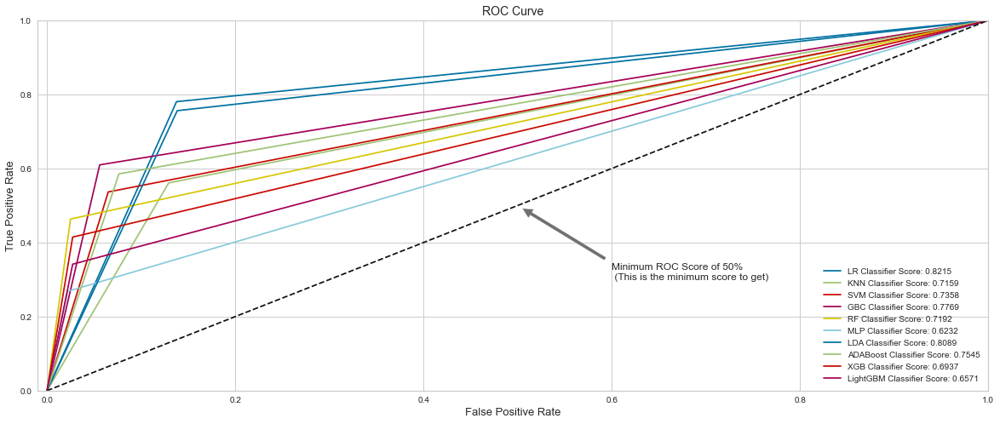

In [68]:
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

models = get_model()
names,results,result_df= bl_performance(X_tsne, y_train,models)

In [69]:
result_df.sort_values(by='F1',ascending=False,inplace=True)
result_df

,Model,Accuracy,F1,Recall,Precision
4,RF,0.946228,0.748948,0.985253,0.687018
8,XGB,0.935423,0.729411,0.980391,0.672683
9,LightGBM,0.938347,0.729329,0.971983,0.671945
1,KNN,0.937968,0.716456,0.993803,0.656200
3,GBC,0.874652,0.665557,0.929539,0.638149
5,MLP,0.862450,0.649940,0.943272,0.623589
2,SVM,0.832195,0.622983,0.914462,0.608703
7,ADABoost,0.797991,0.591805,0.819065,0.608807
6,LDA,0.737351,0.549306,0.788829,0.590101
0,LR,0.733538,0.548107,0.790607,0.588633


In [70]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(result_df, x="Model", y=['Accuracy','F1','Recall','Precision'], barmode='group',
             height=400)

fig.update_yaxes(title_text="Model Metrics")
fig.update_layout(
    title_text="Model Performance"
)
fig.show()

### PHATE

In [71]:
!pip install phate

Calculating PHATE...
  Running PHATE on 7866 observations and 51 variables.
  Calculating graph and diffusion operator...
    Calculating KNN search...
    Calculated KNN search in 7.64 seconds.
    Calculating affinities...
    Calculated affinities in 0.22 seconds.
  Calculated graph and diffusion operator in 7.90 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.91 seconds.
    Calculating KMeans...
    Calculated KMeans in 39.32 seconds.
  Calculated landmark operator in 42.11 seconds.
  Calculating optimal t...
    Automatically selected t = 11
  Calculated optimal t in 6.16 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 2.04 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 14.58 seconds.
Calculated PHATE in 72.82 seconds.


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning:

Call to deprecated function (or staticmethod) scatter2d. (Use scprep.plot.scatter2d instead) -- Deprecated since version 1.0.0.



<AxesSubplot:>

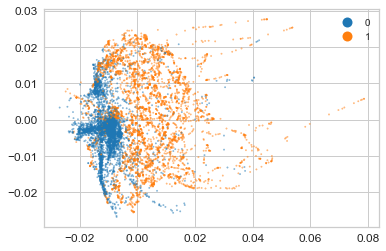

In [72]:
import phate
p = phate.PHATE(random_state=42)
X_phate = p.fit_transform(X_train_prepared)
X_phate.shape
fig, ax = plt.subplots(figsize=(6, 4))
phate.plot.scatter2d(p, c=y_train['Bankrupt?'], ax=ax, alpha=0.5)

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.02894783, 0.01661229, 0.01445007, 0.01417685, 0.01662588]), 'score_time': array([0.00797272, 0.00697589, 0.00398636, 0.00498319, 0.00474739]), 'test_accuracy': array([0.02986023, 0.02542912, 0.86904005, 0.05530833, 0.06357279]), 'test_f1': array([0.0579889 , 0.04959702, 0.84580838, 0.10481928, 0.11954573]), 'test_recall': array([1.        , 1.        , 0.80714286, 0.05530833, 0.06357279]), 'test_precision': array([0.02986023, 0.02542912, 0.88836478, 1.        , 1.        ])}
LR: CV accuracy mean: 0.2086
LR: CV F1 score mean: 0.2356
LR: CV Recall score mean: 0.5852
LR: CV Precision score mean: 0.5887


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:179: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-pac

{'fit_time': array([0.00996661, 0.00954914, 0.00859237, 0.01338696, 0.00691867]), 'score_time': array([0.07251072, 0.06817985, 0.09945989, 0.0598197 , 0.05957627]), 'test_accuracy': array([0.86340534, 0.8633185 , 0.89764781, 0.91417673, 0.90591227]), 'test_f1': array([0.30420712, 0.27118644, 0.88904204, 0.9551644 , 0.95063376]), 'test_recall': array([1.        , 1.        , 0.92142857, 0.91417673, 0.90591227]), 'test_precision': array([0.17938931, 0.15686275, 0.85885486, 1.        , 1.        ])}
KNN: CV accuracy mean: 0.8889
KNN: CV F1 score mean: 0.674
KNN: CV Recall score mean: 0.9483
KNN: CV Precision score mean: 0.639


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([1.1063354 , 1.11915612, 1.2073288 , 1.22769952, 1.18417144]), 'score_time': array([0.3992126 , 0.43577647, 0.45761657, 0.43125439, 0.63066602]), 'test_accuracy': array([0.87166455, 0.87984743, 0.87730451, 0.82771774, 0.82835346]), 'test_f1': array([0.29861111, 0.28679245, 0.86085076, 0.90573913, 0.90611961]), 'test_recall': array([0.91489362, 0.95      , 0.85285714, 0.82771774, 0.82835346]), 'test_precision': array([0.17842324, 0.16888889, 0.86899563, 1.        , 1.        ])}
SVM: CV accuracy mean: 0.857
SVM: CV F1 score mean: 0.6516
SVM: CV Recall score mean: 0.8748
SVM: CV Precision score mean: 0.6433


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.91809225, 0.98564553, 1.01014996, 0.95865273, 0.75623608]), 'score_time': array([0.01365113, 0.0130837 , 0.01424026, 0.00814986, 0.00815964]), 'test_accuracy': array([0.86531131, 0.87984743, 0.89574062, 0.89001907, 0.87794024]), 'test_f1': array([0.30263158, 0.29739777, 0.88531469, 0.94180962, 0.93500339]), 'test_recall': array([0.9787234 , 1.        , 0.90428571, 0.89001907, 0.87794024]), 'test_precision': array([0.17898833, 0.17467249, 0.86712329, 1.        , 1.        ])}
GBC: CV accuracy mean: 0.8818
GBC: CV F1 score mean: 0.6724
GBC: CV Recall score mean: 0.9302
GBC: CV Precision score mean: 0.6442


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:593: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packag

{'fit_time': array([0.96809673, 0.9735136 , 1.06335449, 0.9896121 , 1.01024485]), 'score_time': array([0.05529094, 0.06564784, 0.0435307 , 0.09922671, 0.07736039]), 'test_accuracy': array([0.87420584, 0.87539733, 0.906548  , 0.91608392, 0.89319771]), 'test_f1': array([0.32191781, 0.28985507, 0.89698669, 0.95620438, 0.9435863 ]), 'test_recall': array([1.        , 1.        , 0.91428571, 0.91608392, 0.89319771]), 'test_precision': array([0.19183673, 0.16949153, 0.88033012, 1.        , 1.        ])}
RF: CV accuracy mean: 0.8931
RF: CV F1 score mean: 0.6817
RF: CV Recall score mean: 0.9447
RF: CV Precision score mean: 0.6483


C:\Users\Dell\anaconda3\lib\site-packages\ipykernel_launcher.py:60: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataC

{'fit_time': array([7.06450105, 6.71984792, 6.50005126, 6.63078547, 6.86619258]), 'score_time': array([0.00765824, 0.01313829, 0.00956511, 0.01022267, 0.00794792]), 'test_accuracy': array([0.89008895, 0.89574062, 0.86840432, 0.7425302 , 0.72917991]), 'test_f1': array([0.33716475, 0.2991453 , 0.84424379, 0.85224371, 0.84338235]), 'test_recall': array([0.93617021, 0.875     , 0.80142857, 0.7425302 , 0.72917991]), 'test_precision': array([0.20560748, 0.18041237, 0.89189189, 1.        , 1.        ])}
MLP: CV accuracy mean: 0.8252
MLP: CV F1 score mean: 0.6352
MLP: CV Recall score mean: 0.8169
MLP: CV Precision score mean: 0.6556


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63

{'fit_time': array([0.00895286, 0.00842643, 0.00649261, 0.00932026, 0.00560236]), 'score_time': array([0.0082438 , 0.00748158, 0.00777435, 0.01047659, 0.0083642 ]), 'test_accuracy': array([0.88945362, 0.89955499, 0.84297521, 0.61665607, 0.59440559]), 'test_f1': array([0.33587786, 0.29464286, 0.80318725, 0.76287849, 0.74561404]), 'test_recall': array([0.93617021, 0.825     , 0.72      , 0.61665607, 0.59440559]), 'test_precision': array([0.20465116, 0.17934783, 0.90810811, 1.        , 1.        ])}
LDA: CV accuracy mean: 0.7686
LDA: CV F1 score mean: 0.5884
LDA: CV Recall score mean: 0.7384
LDA: CV Precision score mean: 0.6584


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



{'fit_time': array([0.43930745, 0.5140028 , 0.52944899, 0.38065481, 0.32394576]), 'score_time': array([0.05286264, 0.04342961, 0.04273295, 0.03327346, 0.03418875]), 'test_accuracy': array([0.86658196, 0.87158296, 0.87666879, 0.79974571, 0.74570884]), 'test_f1': array([0.30463576, 0.26811594, 0.85860058, 0.8887319 , 0.85433358]), 'test_recall': array([0.9787234 , 0.925     , 0.84142857, 0.79974571, 0.74570884]), 'test_precision': array([0.18039216, 0.15677966, 0.8764881 , 1.        , 1.        ])}
ADABoost: CV accuracy mean: 0.8321
ADABoost: CV F1 score mean: 0.6349
ADABoost: CV Recall score mean: 0.8581
ADABoost: CV Precision score mean: 0.6427


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:49:06] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:49:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:49:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:49:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



[11:49:08] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'fit_time': array([0.40103149, 0.40219569, 0.40646791, 0.40488005, 0.40679884]), 'score_time': array([0.00830889, 0.0090847 , 0.00776434, 0.00721288, 0.01002836]), 'test_accuracy': array([0.87166455, 0.86204704, 0.90781945, 0.90336936, 0.89637635]), 'test_f1': array([0.31292517, 0.26936027, 0.89923558, 0.9492318 , 0.94535702]), 'test_recall': array([0.9787234 , 1.        , 0.92428571, 0.90336936, 0.89637635]), 'test_precision': array([0.18623482, 0.15564202, 0.87550744, 1.        , 1.        ])}
XGB: CV accuracy mean: 0.8883
XGB: CV F1 score mean: 0.6752
XGB: CV Recall score mean: 0.9406
XGB: CV Precision score mean: 0.6435
[11:49:08] WARNING: C:/Users/Administrator/workspace/xgbo

C:\Users\Dell\anaconda3\lib\site-packages\xgboost\sklearn.py:888: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array

{'fit_time': array([0.09648299, 0.09036422, 0.08906078, 0.0929563 , 0.08564401]), 'score_time': array([0.01170397, 0.00920916, 0.01177454, 0.00919533, 0.01145792]), 'test_accuracy': array([0.8729352 , 0.86713287, 0.90464081, 0.90718373, 0.91544819]), 'test_f1': array([0.31506849, 0.271777  , 0.89597781, 0.95133333, 0.95585795]), 'test_recall': array([0.9787234 , 0.975     , 0.92285714, 0.90718373, 0.91544819]), 'test_precision': array([0.1877551 , 0.15789474, 0.87061995, 1.        , 1.        ])}
LightGBM: CV accuracy mean: 0.8935
LightGBM: CV F1 score mean: 0.678
LightGBM: CV Recall score mean: 0.9398
LightGBM: CV Precision score mean: 0.6433


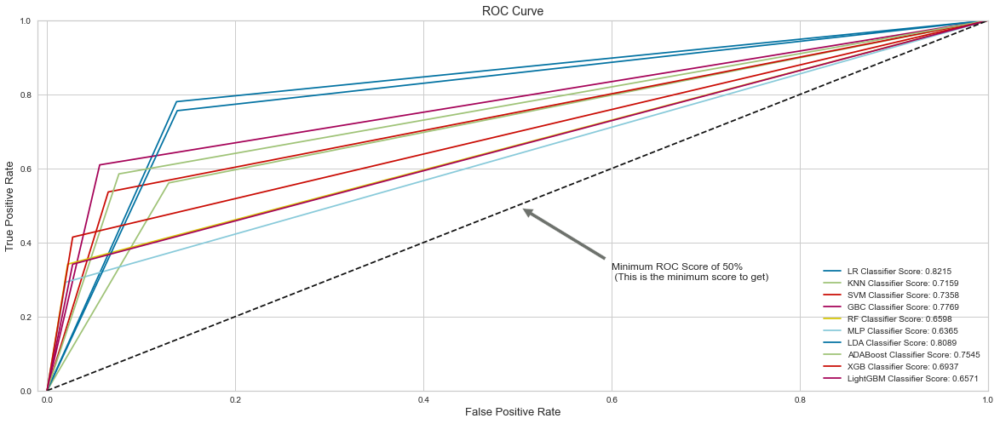

In [73]:
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

models = get_model()
names,results,result_df= bl_performance(X_phate, y_train,models)

In [74]:
result_df.sort_values(by='F1',ascending=False,inplace=True)
result_df

,Model,Accuracy,F1,Recall,Precision
4,RF,0.893087,0.681710,0.944713,0.648332
9,LightGBM,0.893468,0.678003,0.939842,0.643254
8,XGB,0.888255,0.675222,0.940551,0.643477
1,KNN,0.888892,0.674047,0.948304,0.639021
3,GBC,0.881772,0.672431,0.930194,0.644157
2,SVM,0.856978,0.651623,0.874764,0.643262
5,MLP,0.825189,0.635236,0.816862,0.655582
7,ADABoost,0.832058,0.634884,0.858121,0.642732
6,LDA,0.768609,0.588440,0.738446,0.658421
0,LR,0.208642,0.235552,0.585205,0.588731


In [75]:
import plotly.express as px
df = px.data.tips()
fig = px.bar(result_df, x="Model", y=['Accuracy','F1','Recall','Precision'], barmode='group',
             height=400)

fig.update_yaxes(title_text="Model Metrics")
fig.update_layout(
    title_text="Model Performance"
)
fig.show()

## MLflow

In [76]:
!pip install mlflow

  Created wheel for alembic: filename=alembic-1.4.1-py2.py3-none-any.whl size=158162 sha256=53c397ff26e7507047966c976f9009368277b2c56b5a2ab0b9094a1d952866a7
  Stored in directory: c:\users\dell\appdata\local\pip\cache\wheels\be\5d\0a\9e13f53f4f5dfb67cd8d245bb7cdffe12f135846f491a283e3
  Created wheel for databricks-cli: filename=databricks_cli-0.14.3-py3-none-any.whl size=100561 sha256=6d0aee1deb4f7e6a061a48853b75acf6e3649e4948078908f903ff935b63ca61
  Stored in directory: c:\users\dell\appdata\local\pip\cache\wheels\3b\60\14\6930445b08959fbdf4e3029bac7e1f2cccb2e94df8afa00b29
  Created wheel for prometheus-flask-exporter: filename=prometheus_flask_exporter-0.18.1-py3-none-any.whl size=17162 sha256=b9f3c4012c194d19f3ca17460f9837f9460d61139864735a985a77d250ff01fe
  Stored in directory: c:\users\dell\appdata\local\pip\cache\wheels\c4\b6\b5\e76659f3b2a3a226565e27f0a7eb7a3ac93c3f4d68acfbe617
Successfully built alembic databricks-cli prometheus-flask-exporter


In [77]:
!pip install hyperopt

In [78]:
import mlflow
import mlflow.pyfunc
import mlflow.sklearn
from sklearn.model_selection import cross_val_score
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
from hyperopt.pyll import scope
from IPython.display import Image
import numpy as np
import lightgbm as lgb
from lightgbm import LGBMModel,LGBMClassifier

In [79]:
search_space = {"max_depth":scope.int(hp.quniform("max_depth",2,100,5)),
                "n_estimators":scope.int(hp.quniform("n_estimators",2,100,1)),
                "num_leaves": scope.int(hp.quniform("num_leaves",2,50,1)),
                "reg_alpha": hp.loguniform('reg_li',-5,5),
                "random_state":1,
                "learning_rate": hp.loguniform("learning_rate", np.log(0.01), np.log(0.5)),
                "min_child_weight": hp.uniform('min_child_weight', 0.5, 10),
                "boosting": hp.choice("boosting",["gbdt","dart","goss"]),
                "objective":"binary"
}

In [80]:
def train_model(parameters):
    mlflow.lightgbm.autolog()
    with mlflow.start_run(nested=True):
        booster = lgb.LGBMClassifier()
        booster.set_params(**parameters)
        booster.fit(X_train_prepared,y_train)
        
        mlflow.log_params(parameters)
        
        score = cross_val_score(booster, X_train_prepared, y_train, cv=5, 
                               scoring = "f1_macro",n_jobs=-1)
        mean_score = np.mean(score)
        
        mlflow.log_metric('f1_macro', mean_score)
        
        return{'status':STATUS_OK,
               "loss":-1*mean_score,
               'booster':booster.get_params}
    
with mlflow.start_run(run_name='lightgbm_bankruptcy'):
    best_params = fmin(
        fn=train_model,
        space=search_space,
        algo=tpe.suggest,
        max_evals = 50,
        trials = Trials(),
        rstate=np.random.RandomState(1)
    )


2021/04/09 11:50:04 WARNING mlflow.tracking.context.git_context: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh()

All git commands will error until this is rectified.

This initial warning can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|none|n|0: for no warning or exception
    - warn|w|warning|1: for a printed warning
    - error|e|raise|r|2: for a raised exception

Example:
    export GIT_PYTHON_REFRESH=quiet



[LightGBM] [Warning]                                  
boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




  2%|▏         | 1/50 [00:08<06:37,  8.12s/trial, best loss: -0.9593035457682408]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




  4%|▍         | 2/50 [00:13<05:45,  7.20s/trial, best loss: -0.9649002361502322]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




  6%|▌         | 3/50 [00:13<04:06,  5.24s/trial, best loss: -0.9649002361502322]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




  8%|▊         | 4/50 [00:15<03:08,  4.10s/trial, best loss: -0.9649002361502322]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 10%|█         | 5/50 [00:16<02:24,  3.22s/trial, best loss: -0.9669342573213935]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 12%|█▏        | 6/50 [00:17<01:51,  2.53s/trial, best loss: -0.9669342573213935]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 14%|█▍        | 7/50 [00:19<01:41,  2.36s/trial, best loss: -0.9669342573213935]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 16%|█▌        | 8/50 [00:20<01:29,  2.13s/trial, best loss: -0.9754565315162809]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 18%|█▊        | 9/50 [00:24<01:46,  2.61s/trial, best loss: -0.9754565315162809]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 20%|██        | 10/50 [00:26<01:38,  2.46s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 22%|██▏       | 11/50 [00:29<01:33,  2.41s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 24%|██▍       | 12/50 [00:31<01:28,  2.34s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 26%|██▌       | 13/50 [00:31<01:08,  1.86s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 28%|██▊       | 14/50 [00:34<01:09,  1.93s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 30%|███       | 15/50 [00:35<00:59,  1.69s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 32%|███▏      | 16/50 [00:37<01:05,  1.91s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 34%|███▍      | 17/50 [00:40<01:10,  2.13s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 36%|███▌      | 18/50 [00:40<00:53,  1.68s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 38%|███▊      | 19/50 [00:42<00:48,  1.56s/trial, best loss: -0.9804187276285565]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 40%|████      | 20/50 [00:44<00:51,  1.73s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 42%|████▏     | 21/50 [00:45<00:47,  1.65s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 44%|████▍     | 22/50 [00:47<00:43,  1.56s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 46%|████▌     | 23/50 [00:48<00:39,  1.47s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 48%|████▊     | 24/50 [00:49<00:37,  1.43s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 50%|█████     | 25/50 [00:51<00:35,  1.42s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 52%|█████▏    | 26/50 [00:52<00:34,  1.44s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 54%|█████▍    | 27/50 [00:53<00:30,  1.34s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 56%|█████▌    | 28/50 [00:55<00:30,  1.37s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 58%|█████▊    | 29/50 [00:57<00:32,  1.56s/trial, best loss: -0.9865229651014668]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 60%|██████    | 30/50 [01:00<00:44,  2.21s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 62%|██████▏   | 31/50 [01:05<00:53,  2.79s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 64%|██████▍   | 32/50 [01:08<00:55,  3.06s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 66%|██████▌   | 33/50 [01:11<00:50,  2.97s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 68%|██████▊   | 34/50 [01:13<00:43,  2.70s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 70%|███████   | 35/50 [01:17<00:45,  3.02s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 72%|███████▏  | 36/50 [01:20<00:42,  3.03s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 74%|███████▍  | 37/50 [01:22<00:35,  2.75s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 76%|███████▌  | 38/50 [01:26<00:39,  3.28s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 78%|███████▊  | 39/50 [01:29<00:32,  2.98s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 80%|████████  | 40/50 [01:32<00:32,  3.20s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 82%|████████▏ | 41/50 [01:34<00:23,  2.67s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 84%|████████▍ | 42/50 [01:38<00:24,  3.01s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 86%|████████▌ | 43/50 [01:40<00:20,  2.89s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 88%|████████▊ | 44/50 [01:42<00:15,  2.55s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 90%|█████████ | 45/50 [01:44<00:11,  2.38s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 92%|█████████▏| 46/50 [01:46<00:09,  2.31s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 94%|█████████▍| 47/50 [01:48<00:06,  2.06s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 96%|█████████▌| 48/50 [01:52<00:05,  2.69s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




 98%|█████████▊| 49/50 [01:54<00:02,  2.44s/trial, best loss: -0.9888127833391012]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().




100%|██████████| 50/50 [01:56<00:00,  2.34s/trial, best loss: -0.9888127833391012]


In [132]:
X11= X_train_prepared[["Debt ratio %","ROA(C) before interest and depreciation before interest","Working Capital to Total Assets","Borrowing dependency","Net Value Per Share (B)"]]

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7866 entries, 0 to 7865
Data columns (total 5 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Debt ratio %                                             7866 non-null   float64
 1   ROA(C) before interest and depreciation before interest  7866 non-null   float64
 2   Working Capital to Total Assets                          7866 non-null   float64
 3   Borrowing dependency                                     7866 non-null   float64
 4   Net Value Per Share (B)                                  7866 non-null   float64
dtypes: float64(5)
memory usage: 368.7 KB


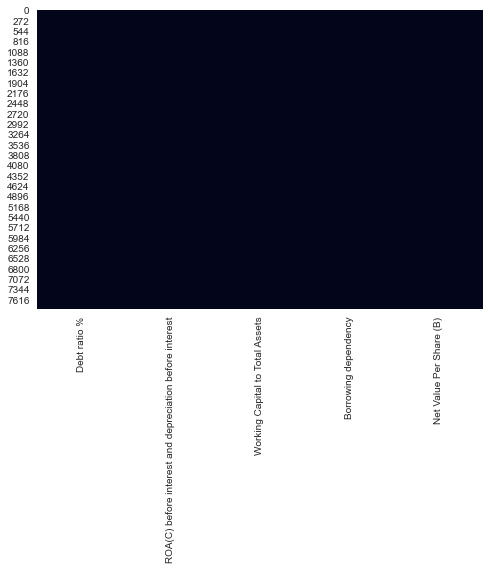

In [109]:
#Preprocessing 
sns.heatmap(X11.isnull(), cbar=False)
X11 = X11.dropna()
X11.info()


In [110]:
#X11.set_index('index', inplace=True)
# Printing the dataframe
X11.reset_index(level=0, inplace=True)
X11

,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
0,0,-0.877927,-0.103694,0.246696,-0.144913,-0.245876
1,1,0.889159,-0.850814,-0.609887,-0.023974,-0.810646
2,2,-0.059033,-1.677584,0.071960,-0.127459,-0.574514
3,3,-0.571692,-0.365744,0.347332,-0.277841,0.049899
4,4,-1.065637,0.674489,2.044436,-0.289581,-0.421149
5,5,0.062893,-0.631776,0.412014,-0.139944,-0.379765
6,6,-0.644281,-0.122810,1.901515,-0.289581,-0.447927
7,7,0.991237,-0.159449,-1.424902,0.293315,-0.210577
8,8,-1.840297,1.094246,0.818301,-0.289581,-0.401674
9,9,-0.647684,1.337976,0.222035,-0.246286,1.324284


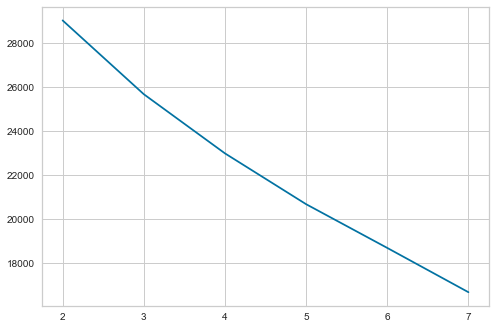

In [111]:
#Elbow process and standarization
from sklearn.preprocessing import StandardScaler
import numpy
scaler = StandardScaler()
X_std11= scaler.fit_transform(X11) 
from sklearn.cluster import KMeans
withinss = []
for i in range (2,8):
     kmeans = KMeans(n_clusters=i)
     model = kmeans.fit(X_std11)
     withinss.append(model.inertia_)
from matplotlib import pyplot
pyplot.plot([2,3,4,5,6,7],withinss)

In [207]:
#silhouette score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
kmeans = KMeans(n_clusters=2)
model = kmeans.fit(X_std11)
labels = model.labels_
from sklearn.metrics import silhouette_samples
silhouette = silhouette_samples(X_std11,labels)
silhouette_avg = silhouette_score(X_std11,labels)
print("The average silhouette_score is :", silhouette_avg)

import pandas
df4 = pandas.DataFrame({'label':labels,'silhouette':silhouette})
print('Average Silhouette Score for Cluster 0: ',np.average(df4[df4['label'] == 0].silhouette))
print('Average Silhouette Score for Cluster 1: ',np.average(df4[df4['label'] == 1].silhouette))
print('Average Silhouette Score for Cluster 2: ',np.average(df4[df4['label'] == 2].silhouette))
#print('Average Silhouette Score for Cluster 3: ',np.average(df4[df4['label'] == 3].silhouette))
#print('Average Silhouette Score for Cluster 4: ',np.average(df4[df4['label'] == 4].silhouette))
#print('Average Silhouette Score for Cluster 5: ',np.average(df4[df4['label'] == 5].silhouette))


The average silhouette_score is : 0.3546294285998111
Average Silhouette Score for Cluster 0:  0.363860276015245
Average Silhouette Score for Cluster 1:  0.34458503158471593
Average Silhouette Score for Cluster 2:  nan


C:\Users\Dell\anaconda3\lib\site-packages\numpy\lib\function_base.py:380: RuntimeWarning:

Mean of empty slice.

C:\Users\Dell\anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars



In [208]:
X11['cluster']=labels
X11.head()
#y_train

,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B),cluster
0,-0.877927,-0.103694,0.246696,-0.144913,-0.245876,1
1,0.889159,-0.850814,-0.609887,-0.023974,-0.810646,1
2,-0.059033,-1.677584,0.071960,-0.127459,-0.574514,1
3,-0.571692,-0.365744,0.347332,-0.277841,0.049899,1
4,-1.065637,0.674489,2.044436,-0.289581,-0.421149,1


In [229]:
#X11.groupby(['cluster']).mean()
X11.groupby(['cluster']).median()

,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
cluster,,,,,
0,1.365947,-0.977192,-1.007442,0.418623,-0.835538
1,-0.194003,0.005427,0.063235,-0.152305,-0.118072


In [209]:
#labels
#X11
#X111=X11.drop(["cluster"], axis = 1, inplace = True)
X111=X11.drop(['cluster'], axis = 1)
X111

,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
0,-0.877927,-0.103694,0.246696,-0.144913,-0.245876
1,0.889159,-0.850814,-0.609887,-0.023974,-0.810646
2,-0.059033,-1.677584,0.071960,-0.127459,-0.574514
3,-0.571692,-0.365744,0.347332,-0.277841,0.049899
4,-1.065637,0.674489,2.044436,-0.289581,-0.421149
5,0.062893,-0.631776,0.412014,-0.139944,-0.379765
6,-0.644281,-0.122810,1.901515,-0.289581,-0.447927
7,0.991237,-0.159449,-1.424902,0.293315,-0.210577
8,-1.840297,1.094246,0.818301,-0.289581,-0.401674
9,-0.647684,1.337976,0.222035,-0.246286,1.324284


In [171]:
#silhouette score
from sklearn.metrics import silhouette_score
silhouette_score(X_std11,labels)

0.3546294285998111

In [197]:
#from sklearn.metrics import confusion_matrix,classification_report
#print(classification_report(y_train,cluster))

In [210]:
# grid search solver for lda
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# define dataset
#X, y = make_classification(n_samples=1000, n_features=10, n_informative=10, n_redundant=0, random_state=1)
X=X11
y=y_train
# define model
model = LinearDiscriminantAnalysis()
# define model evaluation method
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(model, grid, scoring='accuracy', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X, y)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.912
Config: {'solver': 'svd'}


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [211]:
# grid search solver for lda
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# define dataset
#X, y = make_classification(n_samples=1000, n_features=10, n_informative=10, n_redundant=0, random_state=1)
X=X111
y=y_train
# define model
model = LinearDiscriminantAnalysis()
# define model evaluation method
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(model, grid, scoring='accuracy', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X, y)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.857
Config: {'solver': 'svd'}


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [213]:
#silhouette score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
kmeans = KMeans(n_clusters=3)
model = kmeans.fit(X_std11)
labels = model.labels_
from sklearn.metrics import silhouette_samples
silhouette = silhouette_samples(X_std11,labels)
silhouette_avg = silhouette_score(X_std11,labels)
print("The average silhouette_score is :", silhouette_avg)

import pandas
df4 = pandas.DataFrame({'label':labels,'silhouette':silhouette})
print('Average Silhouette Score for Cluster 0: ',np.average(df4[df4['label'] == 0].silhouette))
print('Average Silhouette Score for Cluster 1: ',np.average(df4[df4['label'] == 1].silhouette))
print('Average Silhouette Score for Cluster 2: ',np.average(df4[df4['label'] == 2].silhouette))
#print('Average Silhouette Score for Cluster 3: ',np.average(df4[df4['label'] == 3].silhouette))
#print('Average Silhouette Score for Cluster 4: ',np.average(df4[df4['label'] == 4].silhouette))
#print('Average Silhouette Score for Cluster 5: ',np.average(df4[df4['label'] == 5].silhouette))


The average silhouette_score is : 0.2271366710807577
Average Silhouette Score for Cluster 0:  0.2290456545355256
Average Silhouette Score for Cluster 1:  0.26308947068952115
Average Silhouette Score for Cluster 2:  0.15324877321334532


In [216]:
X111['cluster']=labels
X111.head()
X111= pd.get_dummies(X111, columns = ['cluster'])
X111.head()


,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B),cluster_0,cluster_1,cluster_2
0,-0.877927,-0.103694,0.246696,-0.144913,-0.245876,0,0,1
1,0.889159,-0.850814,-0.609887,-0.023974,-0.810646,1,0,0
2,-0.059033,-1.677584,0.071960,-0.127459,-0.574514,1,0,0
3,-0.571692,-0.365744,0.347332,-0.277841,0.049899,0,0,1
4,-1.065637,0.674489,2.044436,-0.289581,-0.421149,0,0,1


In [217]:
# grid search solver for lda
from sklearn.datasets import make_classification
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
# define dataset
#X, y = make_classification(n_samples=1000, n_features=10, n_informative=10, n_redundant=0, random_state=1)
X=X111
y=y_train
# define model
model = LinearDiscriminantAnalysis()
# define model evaluation method
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
# define grid
grid = dict()
grid['solver'] = ['svd', 'lsqr', 'eigen']
# define search
search = GridSearchCV(model, grid, scoring='accuracy', cv=cv, n_jobs=-1)
# perform the search
results = search.fit(X, y)
# summarize
print('Mean Accuracy: %.3f' % results.best_score_)
print('Config: %s' % results.best_params_)

Mean Accuracy: 0.896
Config: {'solver': 'svd'}


C:\Users\Dell\anaconda3\lib\site-packages\sklearn\model_selection\_search.py:921: UserWarning:

One or more of the test scores are non-finite: [0.89588279 0.89588279        nan]

C:\Users\Dell\anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [212]:
#Data retrival and merger 
def ClusterIndicesComp(clustNum, labels_array): #list comprehension
    return np.array([i for i, x in enumerate(labels_array) if x == clustNum])

In [173]:
ab0=ClusterIndicesComp(0, labels)
dataframe0=pd.DataFrame(ab0, columns=["index"]) 
print (dataframe0)
dataframe0.info()
result0 = pd.merge(dataframe0,X11,on='index',how="left")

      index
0        14
1        18
2        25
3        29
4        49
5        73
6        74
7        96
8       139
9       140
10      163
11      183
12      188
13      200
14      201
15      222
16      279
17      294
18      318
19      326
20      351
21      385
22      413
23      414
24      441
25      446
26      450
27      472
28      485
29      492
30      496
31      501
32      507
33      519
34      531
35      534
36      579
37      603
38      630
39      634
40      638
41      643
42      656
43      659
44      660
45      676
46      677
47      678
48      687
49      691
50      697
51      709
52      710
53      718
54      728
55      740
56      761
57      762
58      766
59      796
60      803
61      818
62      836
63      856
64      867
65      873
66      909
67      912
68      921
69      944
70      963
71      967
72      972
73      975
74      998
75     1008
76     1033
77     1036
78     1068
79     1083
80     1087
81     1088
82  

KeyError: 'index'

In [255]:
m0=result0.median()
print(m0)
des0=result0.describe()
des0

index                                                      2712.500000
Debt ratio %                                                  0.330760
ROA(C) before interest and depreciation before interest      -0.339459
Working Capital to Total Assets                              -0.372123
Borrowing dependency                                          0.003730
Net Value Per Share (B)                                      -0.362116
dtype: float64


,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
count,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000,2726.000000
mean,2878.668379,0.351197,-0.422282,-0.321315,0.038298,-0.324396
std,1821.942297,0.717582,0.711231,0.678174,0.212306,0.455525
min,1.000000,-2.102297,-4.394456,-3.443600,-0.289581,-1.705272
25%,1429.250000,-0.096746,-0.772757,-0.774818,-0.111355,-0.575731
50%,2712.500000,0.330760,-0.339459,-0.372123,0.003730,-0.362116
75%,3928.250000,0.844642,0.005427,0.164664,0.156530,-0.104683
max,7859.000000,2.845656,1.734635,2.378520,1.141632,1.616407


In [219]:
ab1=ClusterIndicesComp(1, labels)
dataframe1=pd.DataFrame(ab1, columns=["index"]) 
print (dataframe1)
dataframe1.info()
result1 = pd.merge(dataframe1,X11,on='index',how="left")

      index
0        14
1        25
2        49
3        73
4        74
5       139
6       279
7       294
8       326
9       385
10      450
11      472
12      496
13      507
14      534
15      579
16      603
17      638
18      656
19      660
20      677
21      678
22      710
23      718
24      761
25      803
26      867
27      909
28      912
29      921
30      944
31      963
32      972
33      975
34      998
35     1033
36     1068
37     1109
38     1121
39     1137
40     1159
41     1167
42     1173
43     1177
44     1202
45     1213
46     1241
47     1261
48     1286
49     1325
50     1327
51     1337
52     1370
53     1379
54     1421
55     1453
56     1477
57     1478
58     1580
59     1592
60     1593
61     1599
62     1603
63     1653
64     1693
65     1708
66     1731
67     1749
68     1800
69     1846
70     1862
71     1865
72     1873
73     1905
74     1907
75     1971
76     1978
77     1985
78     1997
79     2014
80     2018
81     2049
82  

KeyError: 'index'

In [254]:
m1=result1.median()
print(m1)
des1=result1.describe()
des1

index                                                      5948.000000
Debt ratio %                                                  1.452296
ROA(C) before interest and depreciation before interest      -1.054128
Working Capital to Total Assets                              -1.240915
Borrowing dependency                                          0.476107
Net Value Per Share (B)                                      -0.900718
dtype: float64


,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
count,3397.000000,3397.000000,3397.000000,3397.000000,3397.000000,3397.000000
mean,5825.246099,1.402340,-1.300867,-1.169334,0.560272,-0.839039
std,1401.047983,0.624681,0.995033,0.809265,0.589342,0.397564
min,14.000000,-0.807039,-7.877563,-3.399626,-0.988386,-3.499393
25%,4927.000000,1.046768,-1.792630,-1.752337,0.281480,-1.131281
50%,5948.000000,1.452296,-1.054128,-1.240915,0.476107,-0.900718
75%,6944.000000,1.799846,-0.639534,-0.531660,0.756925,-0.550129
max,7865.000000,7.732930,1.145802,0.933585,7.741886,0.705958


In [220]:
ab2=ClusterIndicesComp(2, labels)
dataframe2=pd.DataFrame(ab2, columns=["index"]) 
print (dataframe2)
dataframe2.info()
result2 = pd.merge(dataframe2,X11,on='index',how="left")

      index
0         0
1         3
2         4
3         6
4         8
5         9
6        10
7        11
8        15
9        16
10       22
11       23
12       26
13       30
14       31
15       33
16       34
17       36
18       37
19       42
20       43
21       45
22       46
23       50
24       51
25       52
26       53
27       58
28       59
29       60
30       61
31       64
32       65
33       66
34       67
35       68
36       69
37       71
38       72
39       75
40       76
41       77
42       78
43       79
44       82
45       83
46       84
47       85
48       88
49       89
50       90
51       91
52       97
53       98
54      103
55      104
56      105
57      107
58      109
59      111
60      114
61      115
62      120
63      121
64      125
65      129
66      130
67      131
68      133
69      135
70      137
71      138
72      141
73      143
74      144
75      145
76      149
77      153
78      155
79      156
80      157
81      162
82  

KeyError: 'index'

In [231]:
m2=result2.median()
print(m2)
des2=result2.describe()
des2

index                                                      1839.000000
Debt ratio %                                                 -0.787758
ROA(C) before interest and depreciation before interest       0.448282
Working Capital to Total Assets                               0.580103
Borrowing dependency                                         -0.259020
Net Value Per Share (B)                                       0.192309
dtype: float64


,index,Debt ratio %,ROA(C) before interest and depreciation before interest,Working Capital to Total Assets,Borrowing dependency,Net Value Per Share (B)
count,1743.000000,1743.000000,1743.000000,1743.000000,1743.000000,1743.000000
mean,1891.815261,-0.719377,0.531726,0.638553,-0.218112,0.471953
std,1171.573742,0.672812,0.894781,0.895348,0.099586,1.183509
min,0.000000,-2.111938,-2.591173,-1.869672,-0.289581,-1.525130
25%,859.000000,-1.242856,-0.059886,-0.017933,-0.289581,-0.184408
50%,1839.000000,-0.787758,0.448282,0.580103,-0.259020,0.192309
75%,2885.000000,-0.247594,1.025747,1.222018,-0.181621,0.811244
max,4241.000000,1.465900,5.858130,2.964073,0.555382,23.373467


In [232]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc

In [233]:
# Scaling the data so that all the features become comparable
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X11)
  
# Normalizing the data so that the data approximately 
# follows a Gaussian distribution
X_normalized = normalize(X_scaled)
  
# Converting the numpy array into a pandas DataFrame
X_normalized = pd.DataFrame(X_normalized)

In [234]:
pca = PCA(n_components = 2)
X_principal = pca.fit_transform(X_normalized)
X_principal = pd.DataFrame(X_principal)
X_principal.columns = ['P1', 'P2']

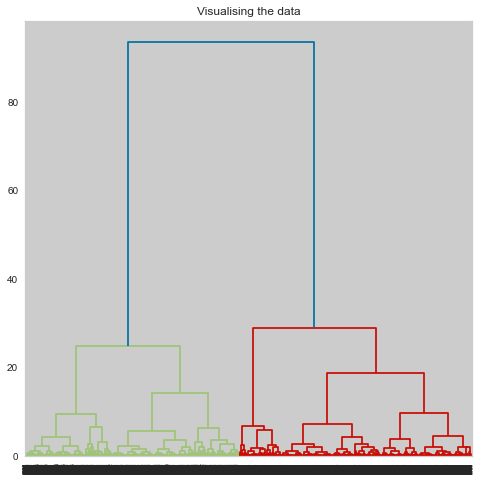

In [235]:
plt.figure(figsize =(8, 8))
plt.title('Visualising the data')
Dendrogram = shc.dendrogram((shc.linkage(X_principal, method ='ward')))

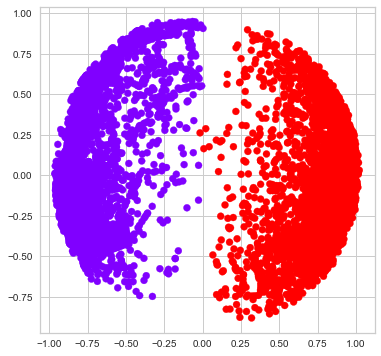

In [236]:
ac2 = AgglomerativeClustering(n_clusters = 2)
  
# Visualizing the clustering
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'], 
           c = ac2.fit_predict(X_principal), cmap ='rainbow')
plt.show()

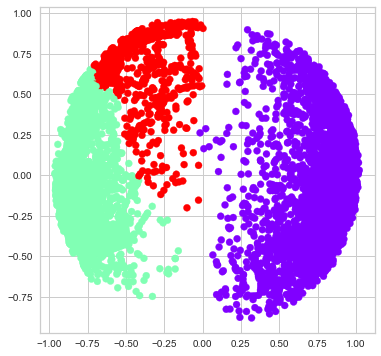

In [237]:
ac3 = AgglomerativeClustering(n_clusters = 3)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
           c = ac3.fit_predict(X_principal), cmap ='rainbow')
plt.show()

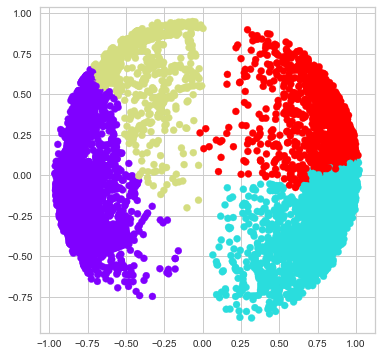

In [238]:
ac4 = AgglomerativeClustering(n_clusters = 4)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac4.fit_predict(X_principal), cmap ='rainbow')
plt.show()

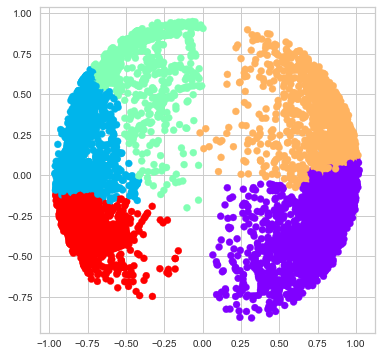

In [239]:
ac5 = AgglomerativeClustering(n_clusters = 5)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac5.fit_predict(X_principal), cmap ='rainbow')
plt.show()

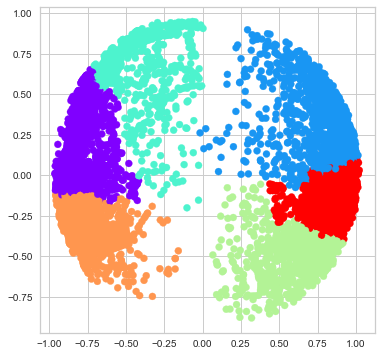

In [240]:
ac6 = AgglomerativeClustering(n_clusters = 6)
  
plt.figure(figsize =(6, 6))
plt.scatter(X_principal['P1'], X_principal['P2'],
            c = ac6.fit_predict(X_principal), cmap ='rainbow')
plt.show()

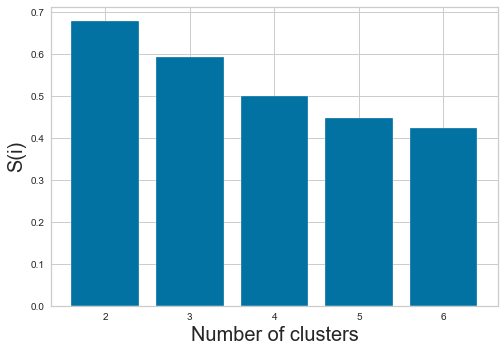

In [241]:
k = [2, 3, 4, 5, 6]
  
# Appending the silhouette scores of the different models to the list
silhouette_scores = []
silhouette_scores.append(
        silhouette_score(X_principal, ac2.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac3.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac4.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac5.fit_predict(X_principal)))
silhouette_scores.append(
        silhouette_score(X_principal, ac6.fit_predict(X_principal)))
  
# Plotting a bar graph to compare the results
plt.bar(k, silhouette_scores)
plt.xlabel('Number of clusters', fontsize = 20)
plt.ylabel('S(i)', fontsize = 20)
plt.show()


Text(0, 0.5, 'Inertia')

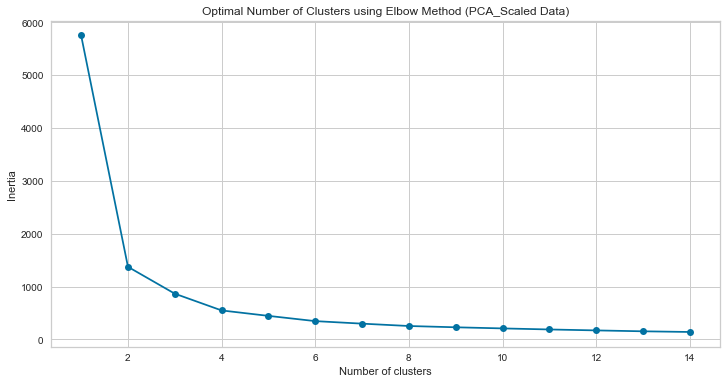

In [242]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(X_principal)
    sse.append([k, km.inertia_])
    
pca_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (PCA_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [243]:
kmeans_pca_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(X_principal)
print('KMeans PCA Scaled Silhouette Score: {}'.format(silhouette_score(X_principal, kmeans_pca_scale.labels_, metric='euclidean')))
labels_pca_scale = kmeans_pca_scale.labels_
clusters_pca_scale = pd.concat([X_principal, pd.DataFrame({'pca_clusters':labels_pca_scale})], axis=1)

KMeans PCA Scaled Silhouette Score: 0.5212980925583702


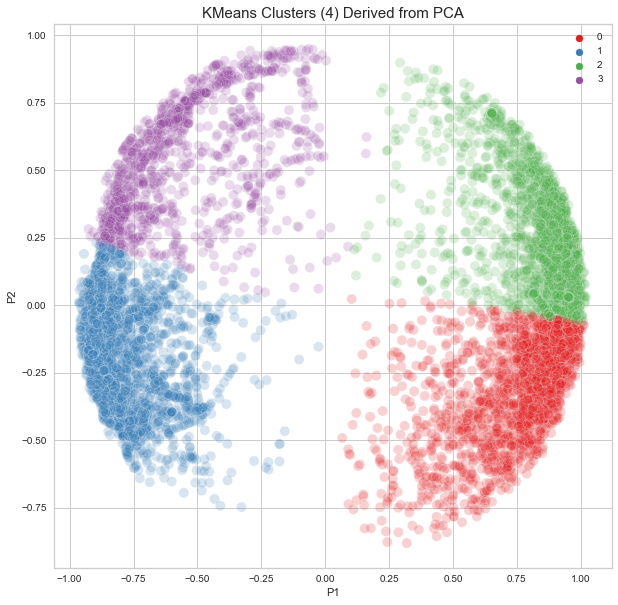

In [244]:
plt.figure(figsize = (10,10))
sns.scatterplot(clusters_pca_scale.iloc[:,0],clusters_pca_scale.iloc[:,1], hue=labels_pca_scale, palette='Set1', s=100, alpha=0.2).set_title('KMeans Clusters (4) Derived from PCA', fontsize=15)
plt.legend()
plt.show()

[t-SNE] Computing 241 nearest neighbors...
[t-SNE] Indexed 7866 samples in 0.020s...
[t-SNE] Computed neighbors for 7866 samples in 0.463s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7866
[t-SNE] Computed conditional probabilities for sample 2000 / 7866
[t-SNE] Computed conditional probabilities for sample 3000 / 7866
[t-SNE] Computed conditional probabilities for sample 4000 / 7866
[t-SNE] Computed conditional probabilities for sample 5000 / 7866
[t-SNE] Computed conditional probabilities for sample 6000 / 7866
[t-SNE] Computed conditional probabilities for sample 7000 / 7866
[t-SNE] Computed conditional probabilities for sample 7866 / 7866
[t-SNE] Mean sigma: 0.029762
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.277252
[t-SNE] KL divergence after 3600 iterations: 0.383424


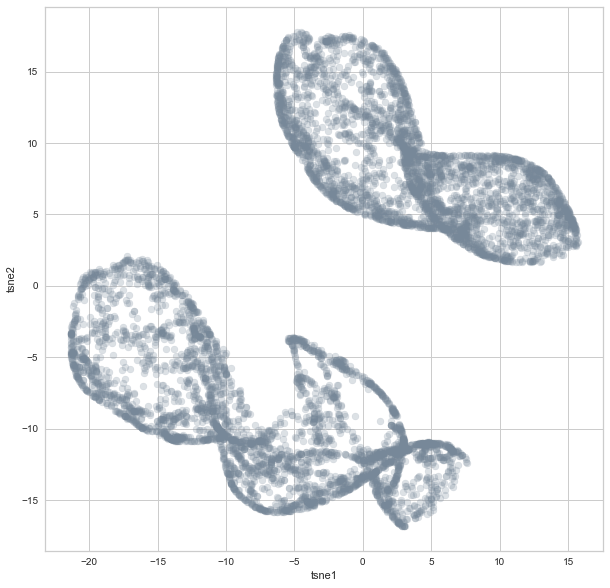

In [245]:
tsne = TSNE(n_components=3, verbose=1, perplexity=80, n_iter=5000, learning_rate=200)
tsne_scale_results = tsne.fit_transform(X_principal)
tsne_df_scale = pd.DataFrame(tsne_scale_results, columns=['tsne1', 'tsne2', 'tsne3'])
plt.figure(figsize = (10,10))
plt.scatter(tsne_df_scale.iloc[:,0],tsne_df_scale.iloc[:,1],alpha=0.25, facecolor='lightslategray')
plt.xlabel('tsne1')
plt.ylabel('tsne2')
plt.show()

Text(0, 0.5, 'Inertia')

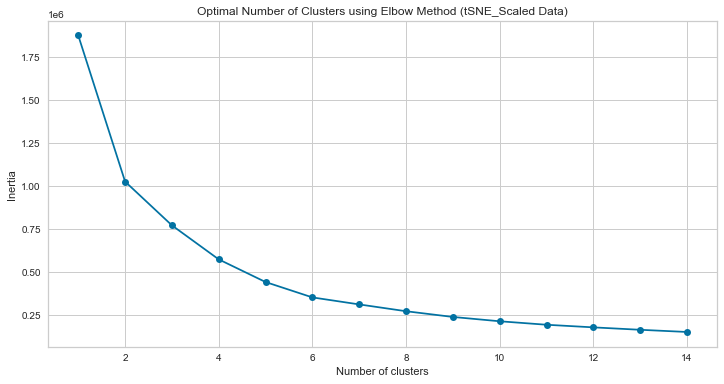

In [246]:
sse = []
k_list = range(1, 15)
for k in k_list:
    km = KMeans(n_clusters=k)
    km.fit(tsne_df_scale)
    sse.append([k, km.inertia_])
    
tsne_results_scale = pd.DataFrame({'Cluster': range(1,15), 'SSE': sse})
plt.figure(figsize=(12,6))
plt.plot(pd.DataFrame(sse)[0], pd.DataFrame(sse)[1], marker='o')
plt.title('Optimal Number of Clusters using Elbow Method (tSNE_Scaled Data)')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')

In [247]:
kmeans_tsne_scale = KMeans(n_clusters=4, n_init=100, max_iter=400, init='k-means++', random_state=42).fit(tsne_df_scale)
print('KMeans tSNE Scaled Silhouette Score: {}'.format(silhouette_score(tsne_df_scale, kmeans_tsne_scale.labels_, metric='euclidean')))
labels_tsne_scale = kmeans_tsne_scale.labels_
clusters_tsne_scale = pd.concat([tsne_df_scale, pd.DataFrame({'tsne_clusters':labels_tsne_scale})], axis=1)

KMeans tSNE Scaled Silhouette Score: 0.39262306690216064


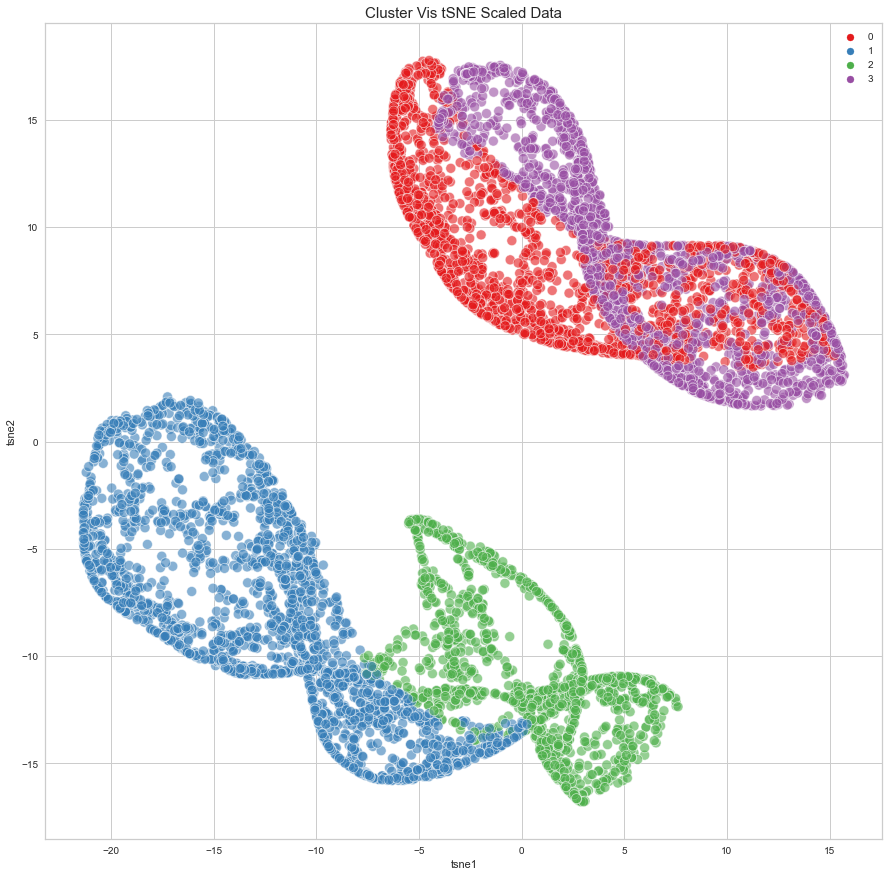

In [248]:
plt.figure(figsize = (15,15))
sns.scatterplot(clusters_tsne_scale.iloc[:,0],clusters_tsne_scale.iloc[:,1],hue=labels_tsne_scale, palette='Set1', s=100, alpha=0.6).set_title('Cluster Vis tSNE Scaled Data', fontsize=15)
plt.legend()
plt.show()

In [249]:
import plotly.graph_objs as go
Scene = dict(xaxis = dict(title  = 'tsne1'),yaxis = dict(title  = 'tsne2'),zaxis = dict(title  = 'tsne3'))
labels = labels_tsne_scale
trace = go.Scatter3d(x=clusters_tsne_scale.iloc[:,0], y=clusters_tsne_scale.iloc[:,1], z=clusters_tsne_scale.iloc[:,2], mode='markers',marker=dict(color = labels, colorscale='Viridis', size = 10, line = dict(color = 'yellow',width = 5)))
layout = go.Layout(margin=dict(l=0,r=0),scene = Scene, height = 1000,width = 1000)
data = [trace]
fig = go.Figure(data = data, layout = layout)
fig.show()

In [250]:
cluster_tsne_profile = pd.merge(X11, clusters_tsne_scale['tsne_clusters'], left_index=True, right_index=True )
cluster_pca_profile = pd.merge(X11, clusters_pca_scale['pca_clusters'], left_index=True, right_index=True )

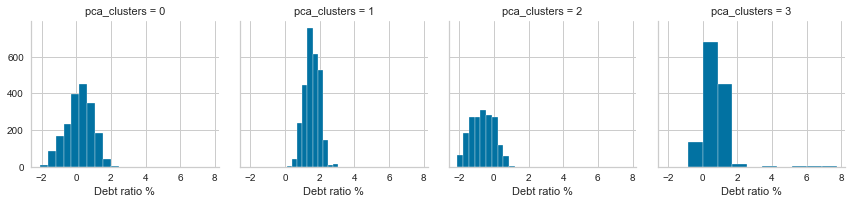

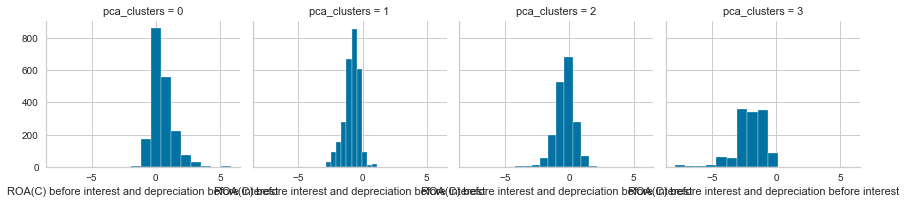

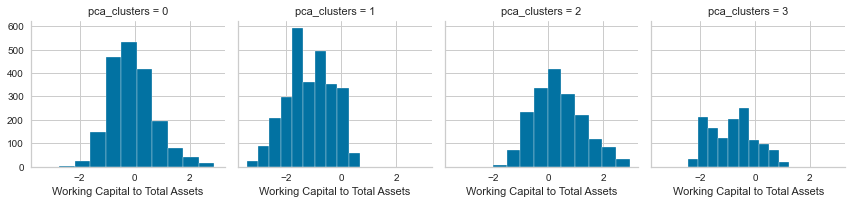

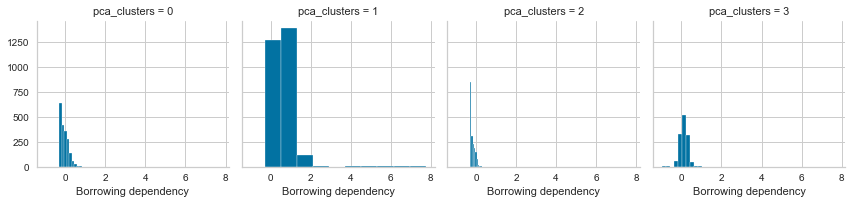

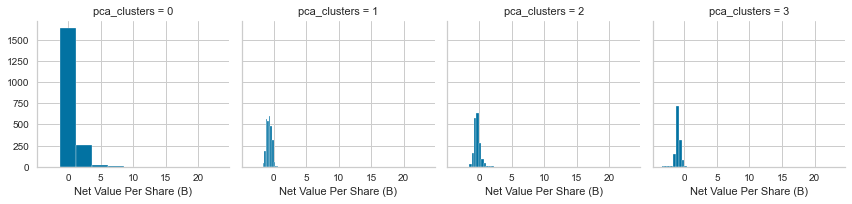

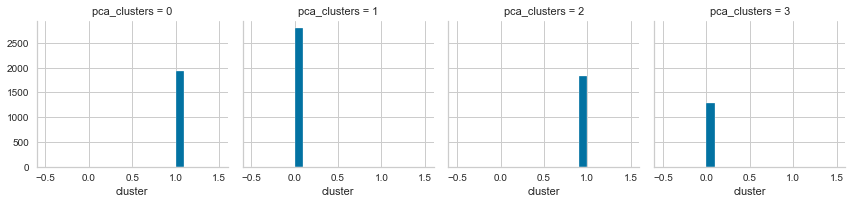

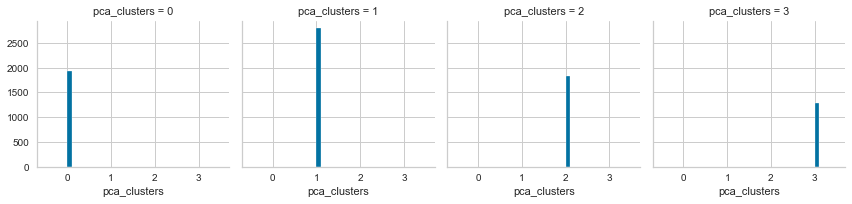

In [251]:
for c in cluster_pca_profile:
    grid = sns.FacetGrid(cluster_pca_profile, col='pca_clusters')
    grid.map(plt.hist, c)

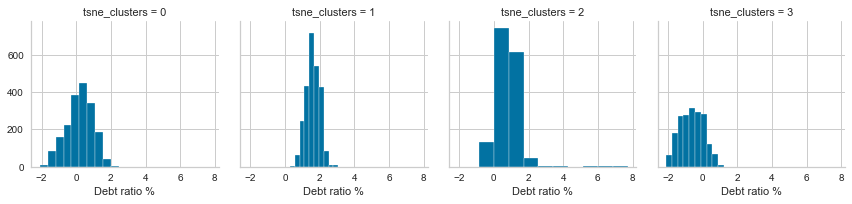

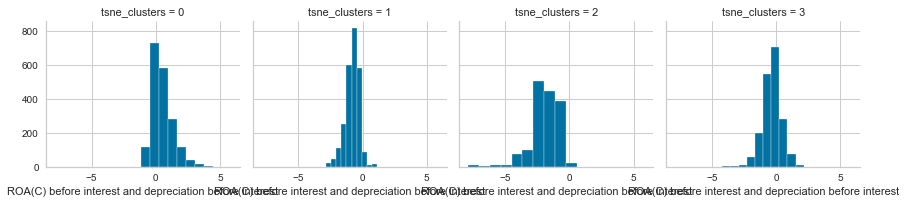

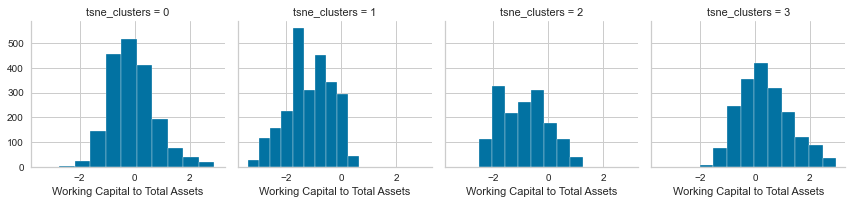

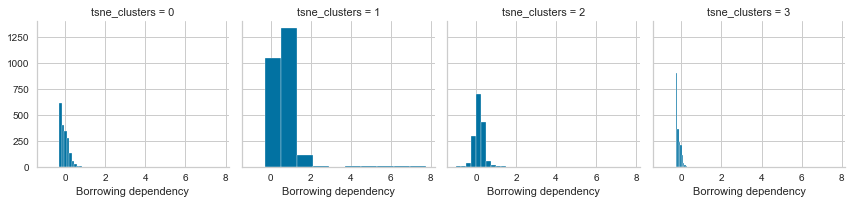

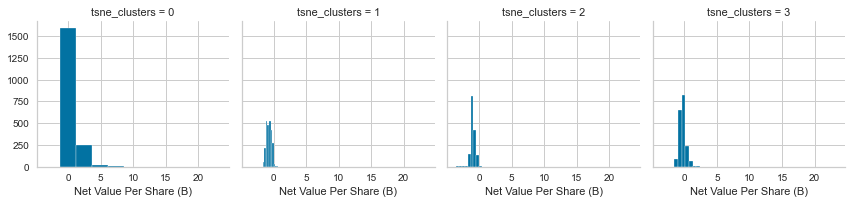

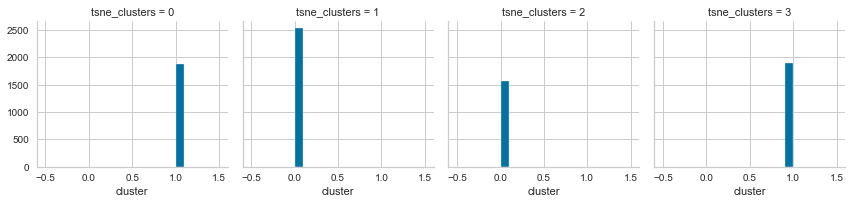

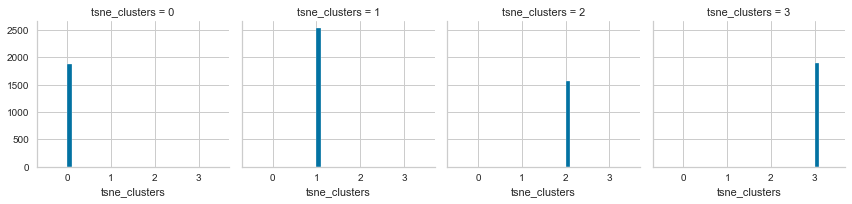

In [252]:
for c in cluster_tsne_profile:
    grid = sns.FacetGrid(cluster_tsne_profile, col='tsne_clusters')
    grid.map(plt.hist, c)

Text(0.5, 1.0, '(tSNE) Clusters by Working Capital to Total Assets  and Debt ratio %')

<Figure size 1080x720 with 0 Axes>

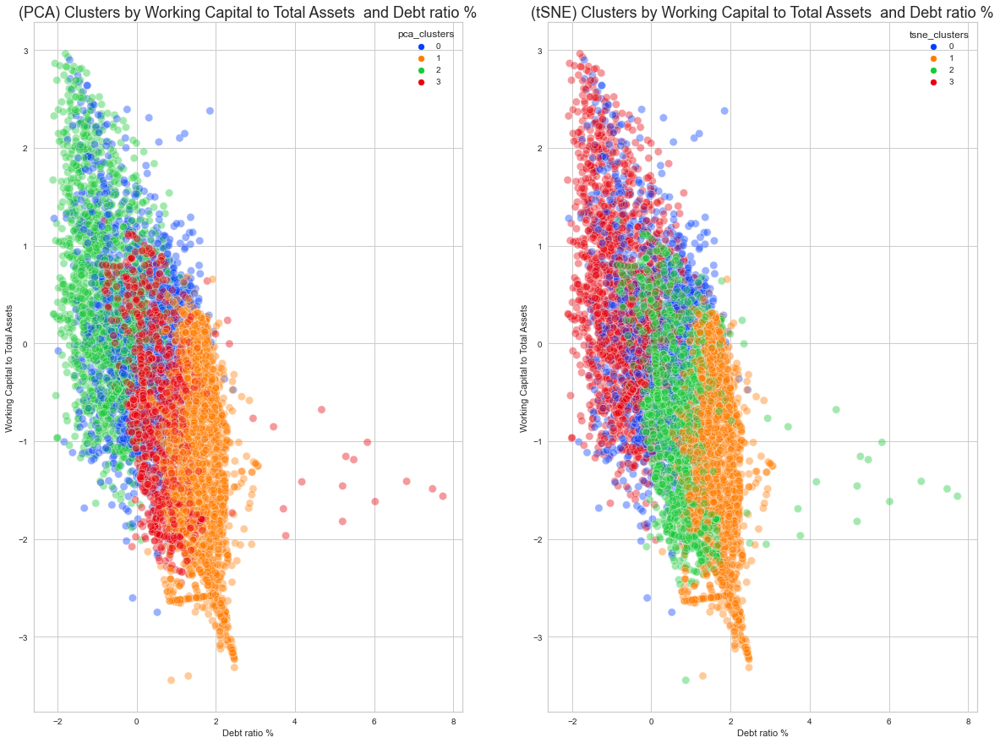

In [253]:
plt.figure(figsize=(15,10))
fig , (ax1, ax2) = plt.subplots(1,2, figsize=(20,15))
sns.scatterplot(data=cluster_pca_profile, x='Debt ratio %', y='Working Capital to Total Assets', 
                hue='pca_clusters', s=85, alpha=0.4, palette='bright', ax=ax1).set_title(
    '(PCA) Clusters by Working Capital to Total Assets  and Debt ratio %',fontsize=18)
sns.scatterplot(data=cluster_tsne_profile, x='Debt ratio %', y='Working Capital to Total Assets', 
                hue='tsne_clusters', s=85, alpha=0.4, palette='bright', ax=ax2).set_title('(tSNE) Clusters by Working Capital to Total Assets  and Debt ratio %', fontsize=18)